In [ ]:
#%tensorflow_version 1.x

import random

import tensorflow as tf
import tensorflow_datasets as tfds

In [2]:
import numpy as np
import random
import time
from matplotlib import pyplot as plt

In [3]:
assert tf.test.is_gpu_available()
assert tf.test.is_built_with_cuda()

In [4]:
learning_rate = 0.0002
batch_size = 16
pool_size = 50
img_width = 256
img_height = 256
img_depth = 3
pool_size = batch_size * 10

In [5]:
# takes in a series of graph_images ([#images, :, :, 0]) and plot them
# each image is displayed as a 50 by 50 pixel image
# where images are laid out in rows of 10 images and columns of 20
def display_graph(graph_images, title, shape=(10, 20), image_size=(50, 50)):
    fig = plt.figure(figsize=image_size) # define figure
    plt.title(title) # define title
    plt.axis('off') # remove axis
    for i in range(0, shape[0] * shape[1]):
        img = graph_images[i, :, :, :].astype(np.int32)
        fig.add_subplot(shape[0], shape[1], i + 1)
        plt.axis('off')
        plt.imshow(img)
    plt.show()

In [6]:
def resnet_block(input, features):
    out1 = tf.layers.conv2d(input, features, (3, 3), (1, 1), 'same')
    out2 = tf.layers.conv2d(out1, features, (3, 3), (1, 1), 'same')
    return out2 + input

In [7]:
def generator(input, scope, reuse=False):
    with tf.variable_scope(scope, reuse=reuse):
        print("input", input)
        conv1 = tf.layers.conv2d(input, 64, (3, 3), (1, 1), 'valid', activation=tf.nn.relu)
        print("conv1", conv1)
        conv2 = tf.layers.conv2d(conv1, 128, (3, 3), (2, 2), 'same', activation=tf.nn.relu)
        print("conv2", conv2)
        conv3 = tf.layers.conv2d(conv2, 256, (3, 3), (2, 2), 'same', activation=tf.nn.relu)
        print("conv3", conv3)
        res1 = resnet_block(conv3, 256)
        res2 = resnet_block(res1, 256)
        res3 = resnet_block(res2, 256)
        res4 = resnet_block(res3, 256)
        res5 = resnet_block(res4, 256)
        res6 = resnet_block(res5, 256)
        print("res6", res6)
        deconv1 = tf.layers.conv2d_transpose(res6, 128, (3, 3), (2, 2), 'same', activation=tf.nn.relu)
        print("deconv1", deconv1)
        deconv2 = tf.layers.conv2d_transpose(deconv1, 64, (3, 3), (2, 2), 'same', activation=tf.nn.relu)
        print("deconv2", deconv2)
        deconv3 = tf.layers.conv2d_transpose(deconv2, 3, (3, 3), (1, 1), 'same')
        print("deconv3", deconv3)
        return tf.nn.tanh(deconv3)

In [8]:
def discriminator(features, scope, reuse=False):
    with tf.variable_scope(scope, reuse=reuse):
        conv1 = tf.layers.conv2d(features, 64, [4, 4], (2, 2), 'same', activation=tf.nn.leaky_relu)
        conv2 = tf.layers.conv2d(conv1, 128, [4, 4], (2, 2), 'same', activation=tf.nn.leaky_relu)
        conv3 = tf.layers.conv2d(conv2, 256, [4, 4], (4, 4), 'same', activation=tf.nn.leaky_relu)
        conv4 = tf.layers.conv2d(conv3, 512, [3, 3], (1, 1), 'valid', activation=tf.nn.leaky_relu)
        flatten = tf.contrib.layers.flatten(conv4)
        logits = tf.layers.dense(flatten, 1)
        # use sigmoid to squash output into a probability
        output = tf.nn.sigmoid(logits) 
        
        return output, logits

In [23]:
def patch_discriminator(features, scope, reuse=False):
    print(features.shape)
    with tf.variable_scope(scope, reuse=reuse):
        #patch_input = tf.random_crop(features,[1,70,70,3])
        conv1 = tf.layers.conv2d(features, 64, [4, 4], (2, 2), 'valid', activation=tf.nn.leaky_relu)
        conv2 = tf.layers.conv2d(conv1, 128, [4, 4], (1, 1), 'valid', activation=tf.nn.leaky_relu)
        conv3 = tf.layers.conv2d(conv2, 128, [4, 4], (1, 1), 'valid', activation=tf.nn.leaky_relu)
        conv4 = tf.layers.conv2d(conv3, 256, [3, 3], (1, 1), 'valid', activation=tf.nn.leaky_relu)
        logits = tf.layers.conv2d(conv3, 1, [3, 3], (2, 2), 'valid') #Linear activation? 
        print(logits.shape)
        # use sigmoid to squash output into a probability
        output = tf.nn.sigmoid(logits) 
        return output, logits

In [9]:
dataset, metadata = tfds.load('cycle_gan/horse2zebra', with_info=True, as_supervised=True)

/home/praveenb/snapshot-env/lib/python3.6/site-packages/urllib3/connectionpool.py:1004: InsecureRequestWarning: Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning,


Instructions for updating:
Use eager execution and: 
`tf.data.TFRecordDataset(path)`


Instructions for updating:
Use eager execution and: 
`tf.data.TFRecordDataset(path)`


Dataset cycle_gan downloaded and prepared to /home/praveenb/tensorflow_datasets/cycle_gan/horse2zebra/0.1.0. Subsequent calls will reuse this data.


In [10]:
train_horses, train_zebras, test_horses, test_zebras = dataset['trainA'], dataset['trainB'], dataset['testA'], dataset['testB']

In [11]:
train_horses_iterator = train_horses.make_initializable_iterator()
train_horses_batch = train_horses_iterator.get_next()
with tf.Session() as sess:
  sess.run(train_horses_iterator.initializer)
  print(sess.run(train_horses_batch)[0].shape)

Instructions for updating:
Use `for ... in dataset:` to iterate over a dataset. If using `tf.estimator`, return the `Dataset` object directly from your input function. As a last resort, you can use `tf.compat.v1.data.make_initializable_iterator(dataset)`.


Instructions for updating:
Use `for ... in dataset:` to iterate over a dataset. If using `tf.estimator`, return the `Dataset` object directly from your input function. As a last resort, you can use `tf.compat.v1.data.make_initializable_iterator(dataset)`.


(256, 256, 3)


In [12]:
def image_pool(self, num_gen, gen_img, gen_pool):
    if(num_gen < pool_size):
        gen_img_pool[num_gen] = gen_img
        return gen_img
    else :
        p = random.random()
        if p > 0.5:
            # Randomly selecting an id to return for calculating the discriminator loss
            random_id = random.randint(0,pool_size-1)
            temp = gen_img_pool[random_id]
            gen_pool[random_id] = gen_img
            return temp
        else :
            return gen_img

In [13]:
def apply_map(inputs, foobar):
    img = inputs # tf??
    # 1. cast the img into float32
    img = tf.cast(img, tf.float32)
    # 2. image values are from 0 to 255. convert to range -1 to 1
    img = 2*(img / 255) - 1
    #img = tf.math.tanh(img)
    # 3. use tf.image.resize to conver the image
    img = tf.image.resize(img, [256, 256])
    return img

train_horses = train_horses.map(apply_map)
train_horses = train_horses.shuffle(1024)
train_horses = train_horses.batch(batch_size)

train_horses_iterator = train_horses.make_initializable_iterator()
train_horses_batch = train_horses_iterator.get_next()

train_zebras = train_zebras.map(apply_map)
train_zebras = train_zebras.shuffle(1024)
train_zebras = train_zebras.batch(batch_size)

train_zebras_iterator = train_zebras.make_initializable_iterator()
train_zebras_batch = train_zebras_iterator.get_next()

In [26]:
input_A = tf.placeholder(tf.float32, shape=[batch_size, 256, 256, 3])
input_B = tf.placeholder(tf.float32, shape=[batch_size, 256, 256, 3])
pool_A = tf.placeholder(tf.float32, shape=[batch_size/2, 256, 256, 3])
pool_B = tf.placeholder(tf.float32, shape=[batch_size/2, 256, 256, 3])

In [ ]:
gen_AtoB = generator(input_A, 'gen_AtoB', reuse=tf.AUTO_REUSE)
gen_BtoA = generator(input_B, 'gen_BtoA', reuse=tf.AUTO_REUSE)
_, patch_disc_A_real_logits = patch_discriminator(input_A, scope='disc_A', reuse=tf.AUTO_REUSE)
_, patch_disc_B_real_logits = patch_discriminator(input_B, scope='disc_B', reuse=tf.AUTO_REUSE)
print("inputA::", input_A)
print("gen_BtoA::", gen_BtoA)
_, patch_disc_A_fake_logits = patch_discriminator(gen_BtoA, scope='disc_A', reuse=tf.AUTO_REUSE)
_, patch_disc_B_fake_logits = patch_discriminator(gen_AtoB, scope='disc_B', reuse=tf.AUTO_REUSE)
_, patch_disc_A_pool_logits = patch_discriminator(pool_A, scope='disc_A', reuse=tf.AUTO_REUSE)
_, patch_disc_B_pool_logits = patch_discriminator(pool_B, scope='disc_A', reuse=tf.AUTO_REUSE)
gen_AtoBtoA = generator(gen_AtoB, 'gen_BtoA', reuse=tf.AUTO_REUSE)
gen_BtoAtoB = generator(gen_BtoA, 'gen_AtoB', reuse=tf.AUTO_REUSE)

In [28]:
disc_A_real_loss = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits_v2(logits=patch_disc_A_real_logits, labels=tf.ones(patch_disc_A_real_logits.shape)))
disc_B_real_loss = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits_v2(logits=patch_disc_B_real_logits, labels=tf.ones(patch_disc_A_real_logits.shape)))
disc_A_fake_loss = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits_v2(logits=patch_disc_A_fake_logits, labels=tf.zeros(patch_disc_A_real_logits.shape)))
disc_B_fake_loss = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits_v2(logits=patch_disc_B_fake_logits, labels=tf.zeros(patch_disc_A_real_logits.shape)))
disc_A_pool_loss = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits_v2(logits=patch_disc_A_pool, labels=tf.zeros(patch_disc_A_pool_logits.shape)))
disc_B_pool_loss = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits_v2(logits=patch_disc_B_pool, labels=tf.zeros(patch_disc_B_pool_logits.shape)))

disc_A_loss = disc_A_real_loss + disc_A_fake_loss + disc_A_pool_loss
disc_B_loss = disc_B_real_loss + disc_B_fake_loss + disc_B_pool_loss

In [29]:
cyclic_loss = (tf.reduce_mean(tf.abs(input_A - gen_AtoBtoA))
             + tf.reduce_mean(tf.abs(input_B - gen_BtoAtoB)))
gen_AtoB_loss = disc_B_fake_loss + 10 * cyclic_loss
gen_BtoA_loss = disc_A_fake_loss + 10 * cyclic_loss

In [30]:
t_vars = tf.trainable_variables()
disc_A_vars = [var for var in t_vars if var.name.startswith('disc_A')]
disc_B_vars = [var for var in t_vars if var.name.startswith('disc_B')]
gen_AtoB_vars = [var for var in t_vars if var.name.startswith('gen_AtoB')]
gen_BtoA_vars = [var for var in t_vars if var.name.startswith('gen_BtoA')]

disc_A_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, name='disc_A_opt')
disc_B_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, name='disc_B_opt')
gen_AtoB_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, name='gen_AtoB_opt')
gen_BtoA_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, name='gen_BtoA_opt')

disc_A_train_op = disc_A_opt.minimize(disc_A_loss, var_list=disc_A_vars)
disc_B_train_op = disc_B_opt.minimize(disc_B_loss, var_list=disc_B_vars)
gen_AtoB_train_op = gen_AtoB_opt.minimize(gen_AtoB_loss, var_list=gen_AtoB_vars)
gen_BtoA_train_op = gen_BtoA_opt.minimize(gen_BtoA_loss, var_list=gen_BtoA_vars)

Starting epoch 0


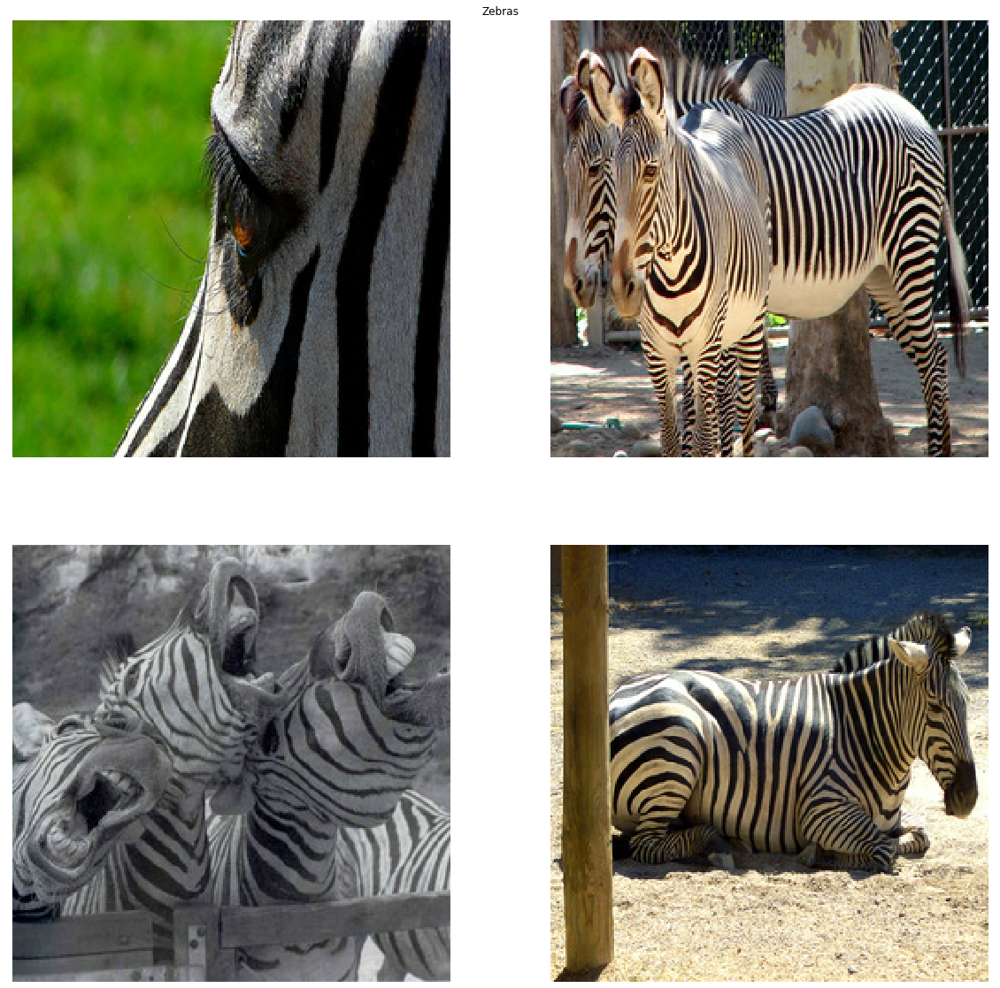

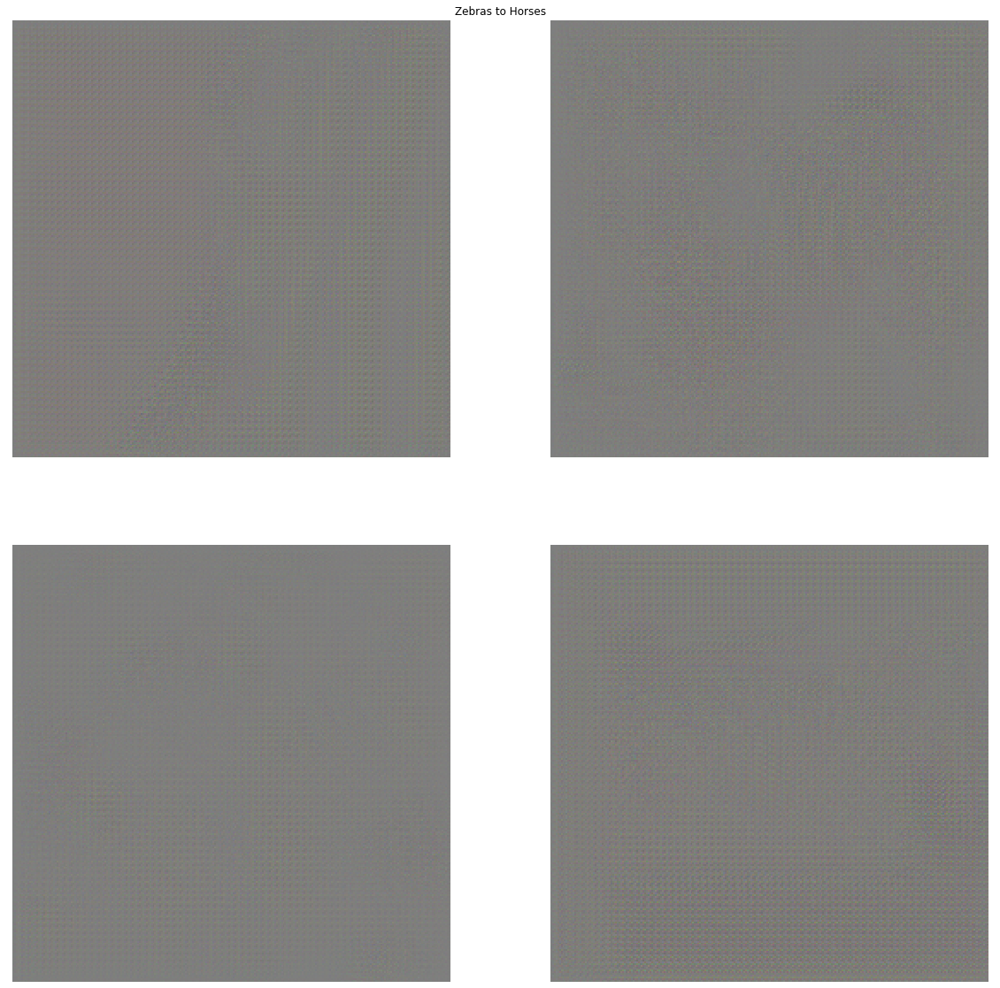

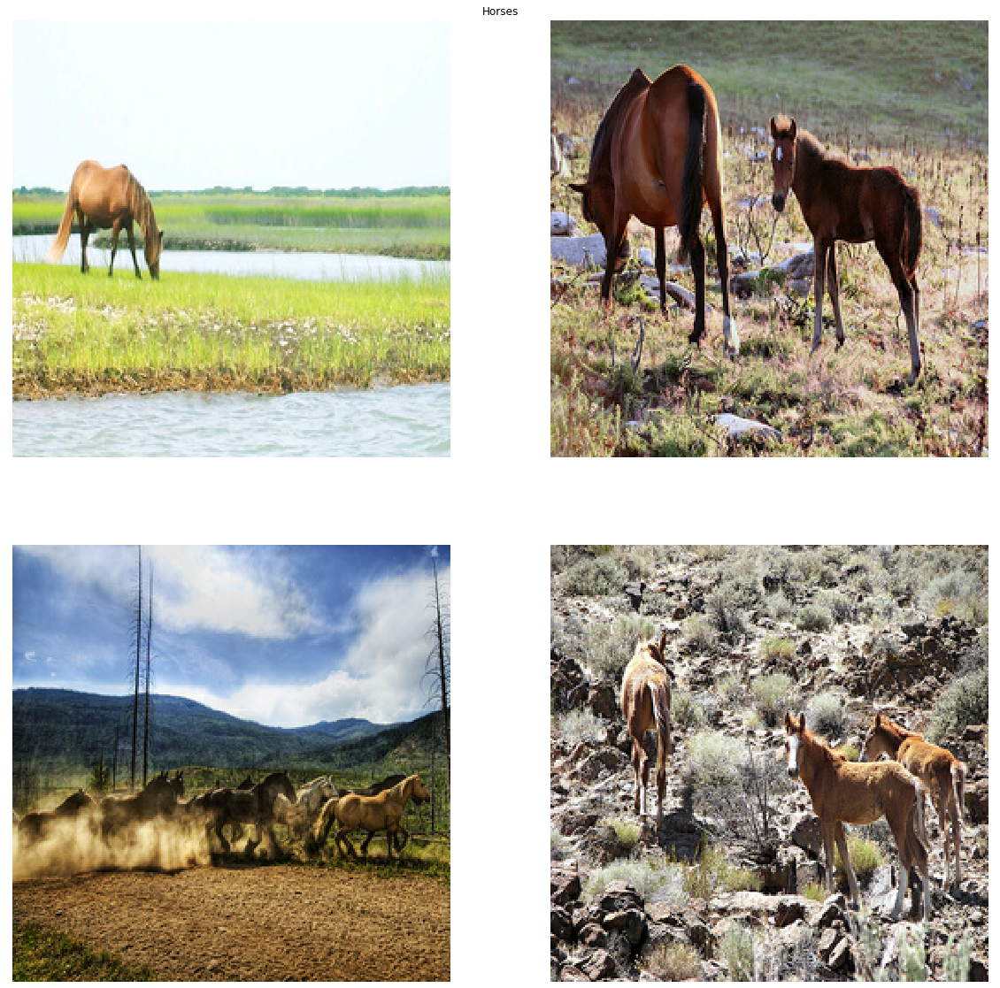

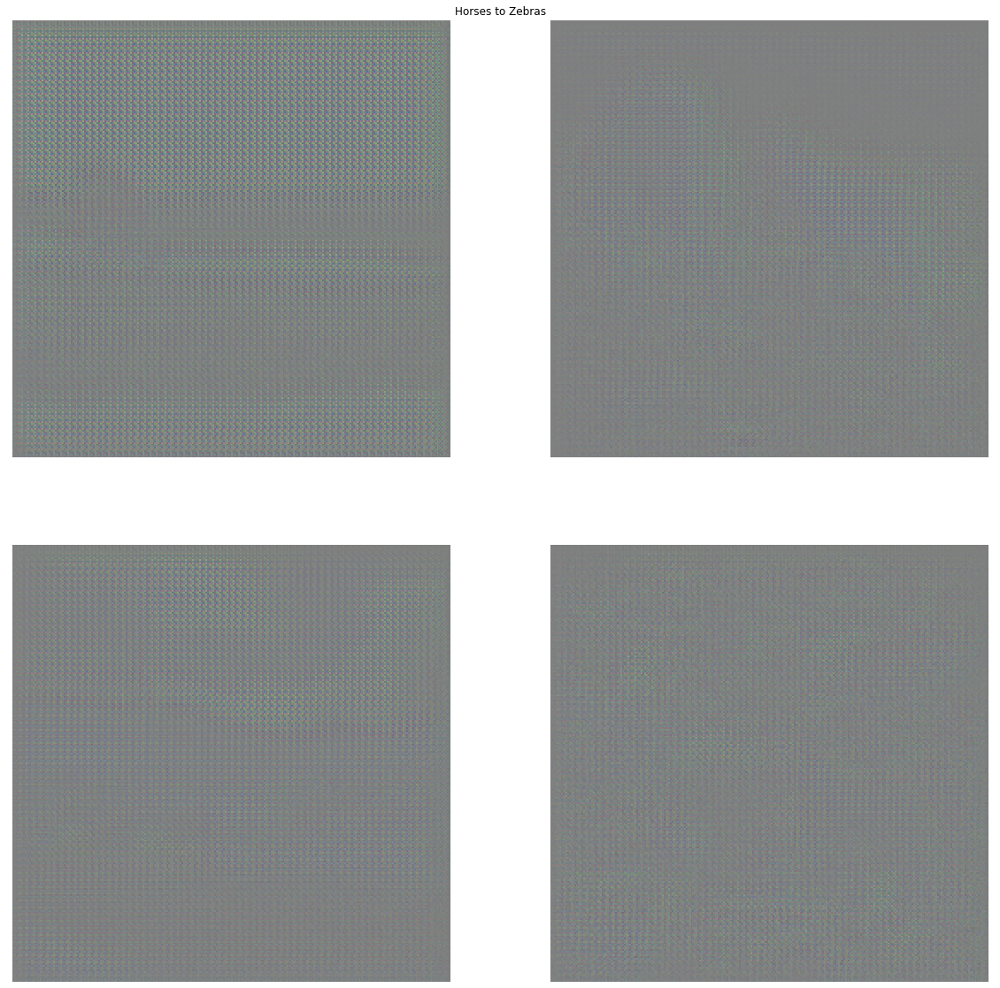

Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 1
Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 2
Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 3
Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 4


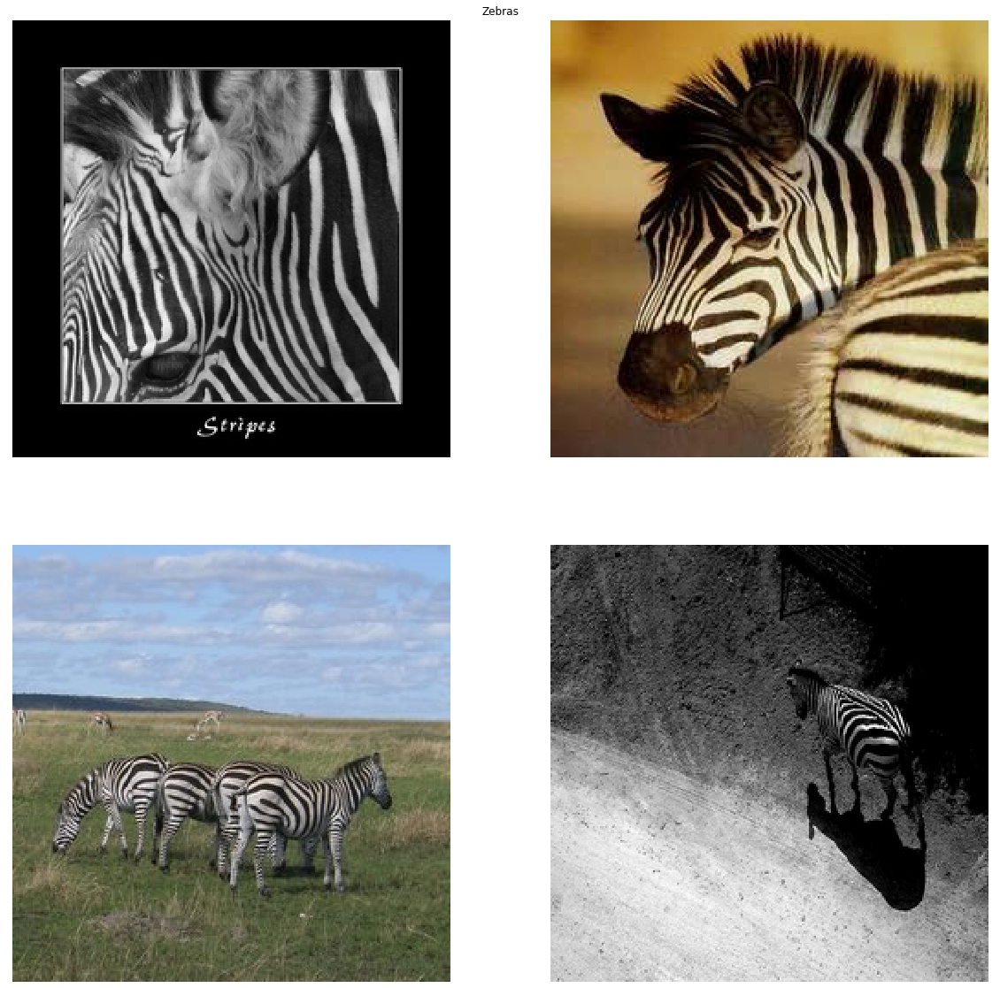

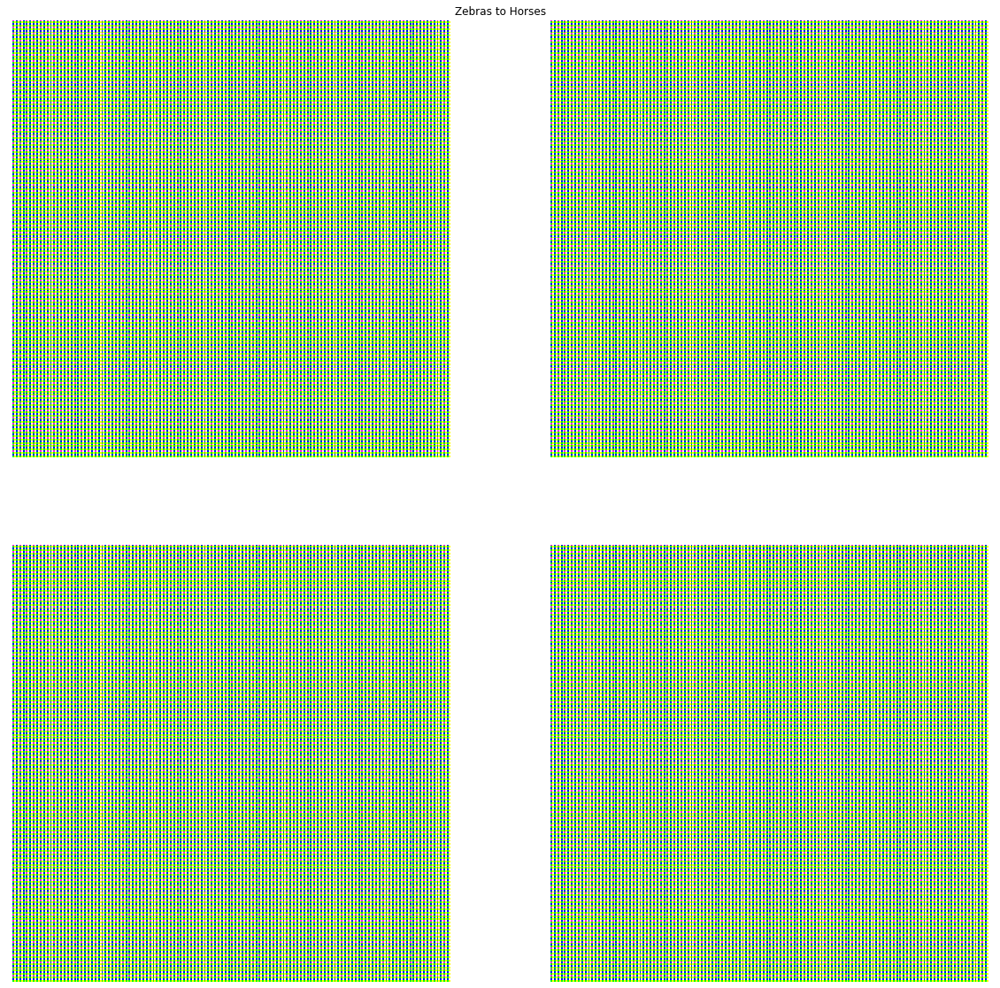

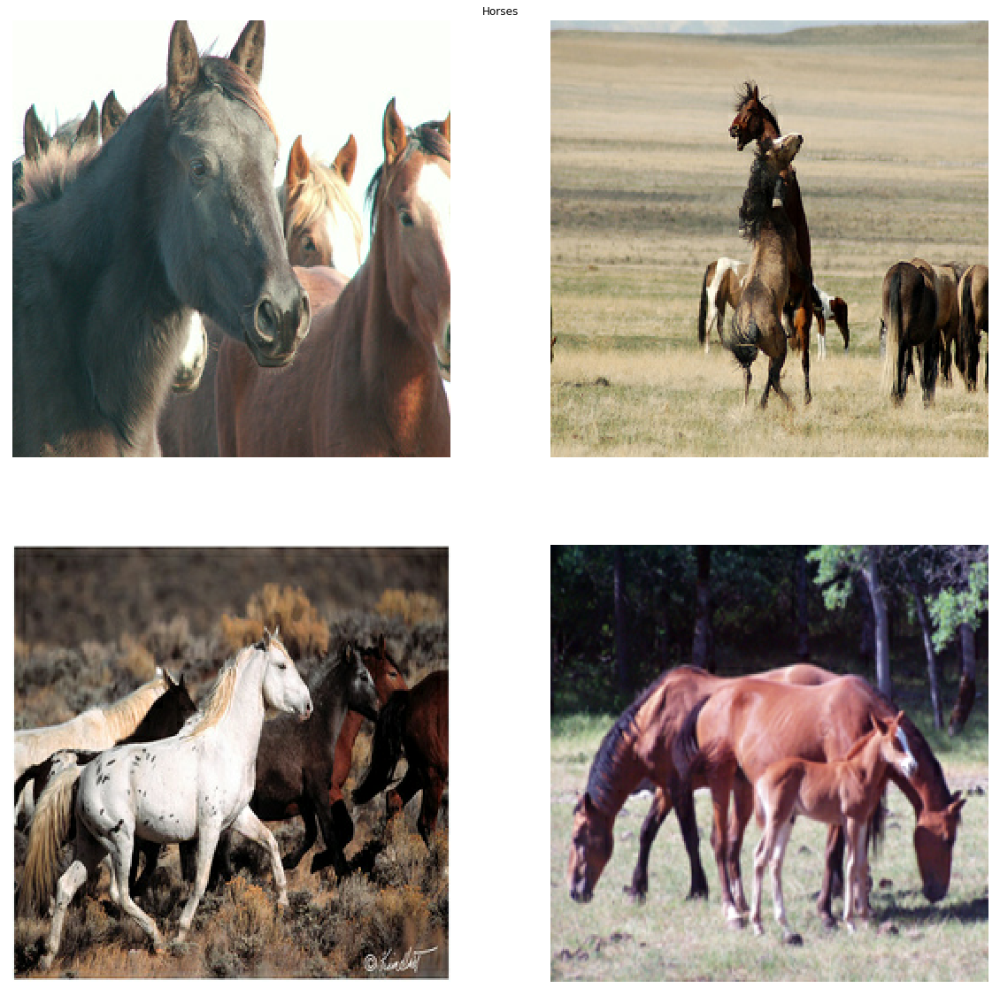

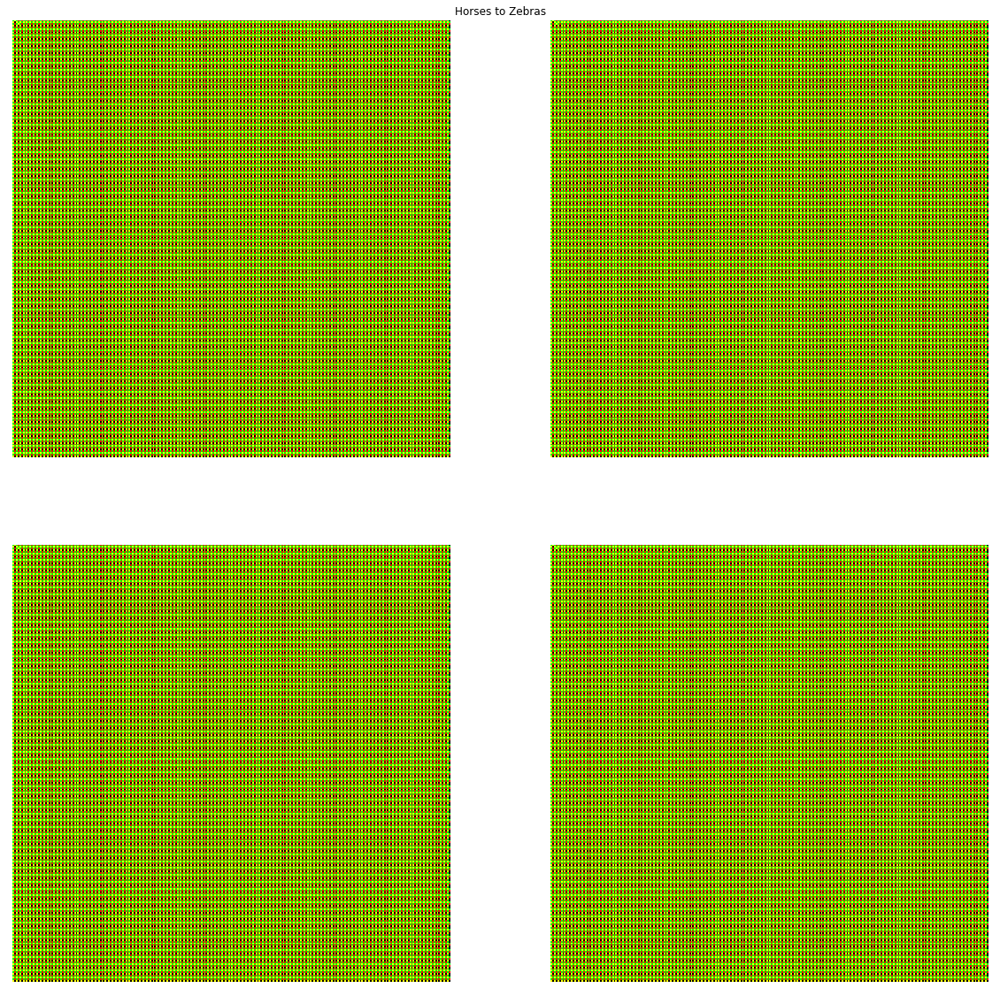

Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 5
Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 6
Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 7
Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 8


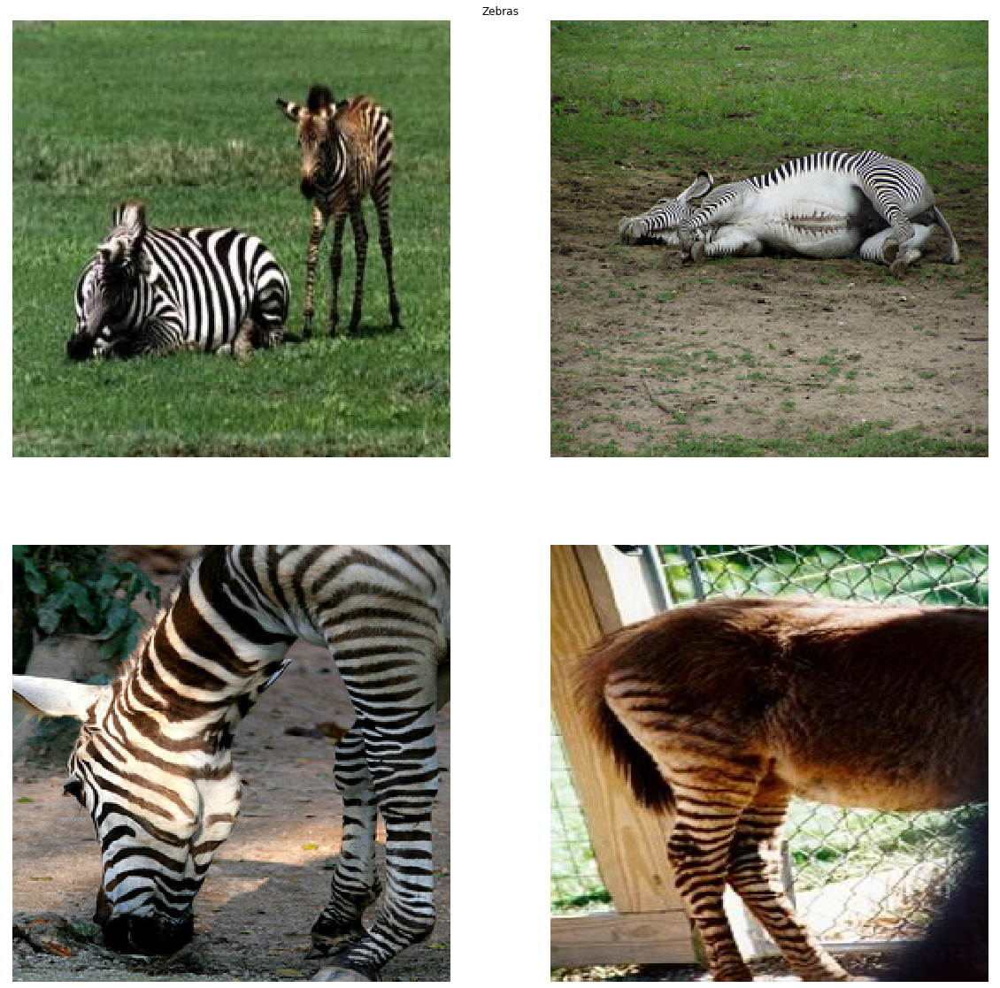

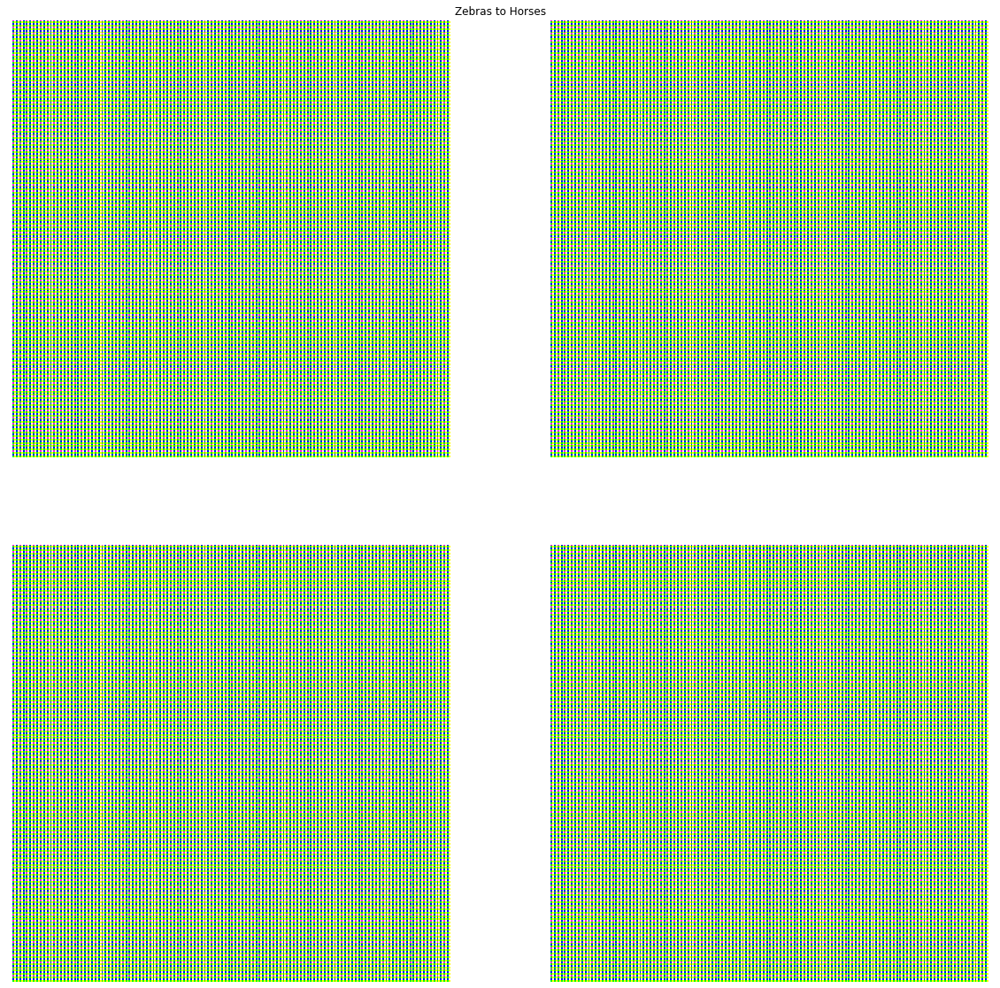

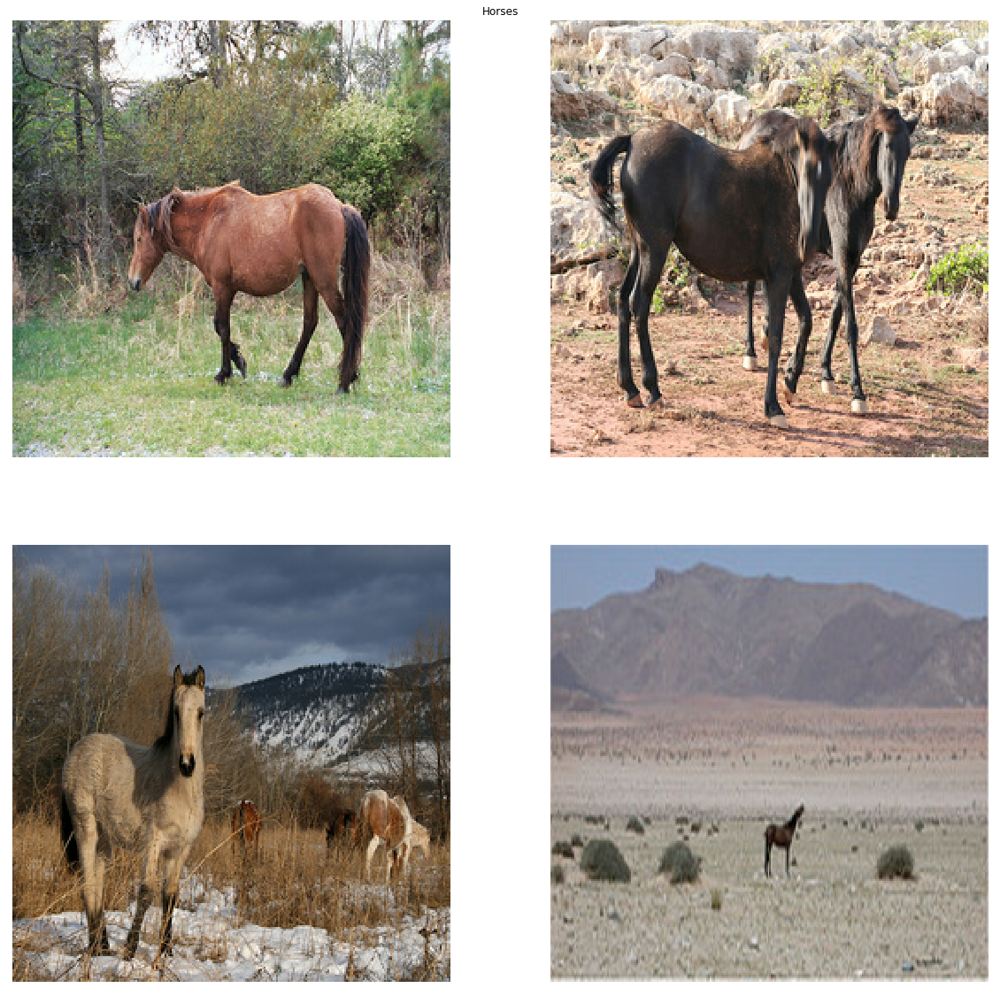

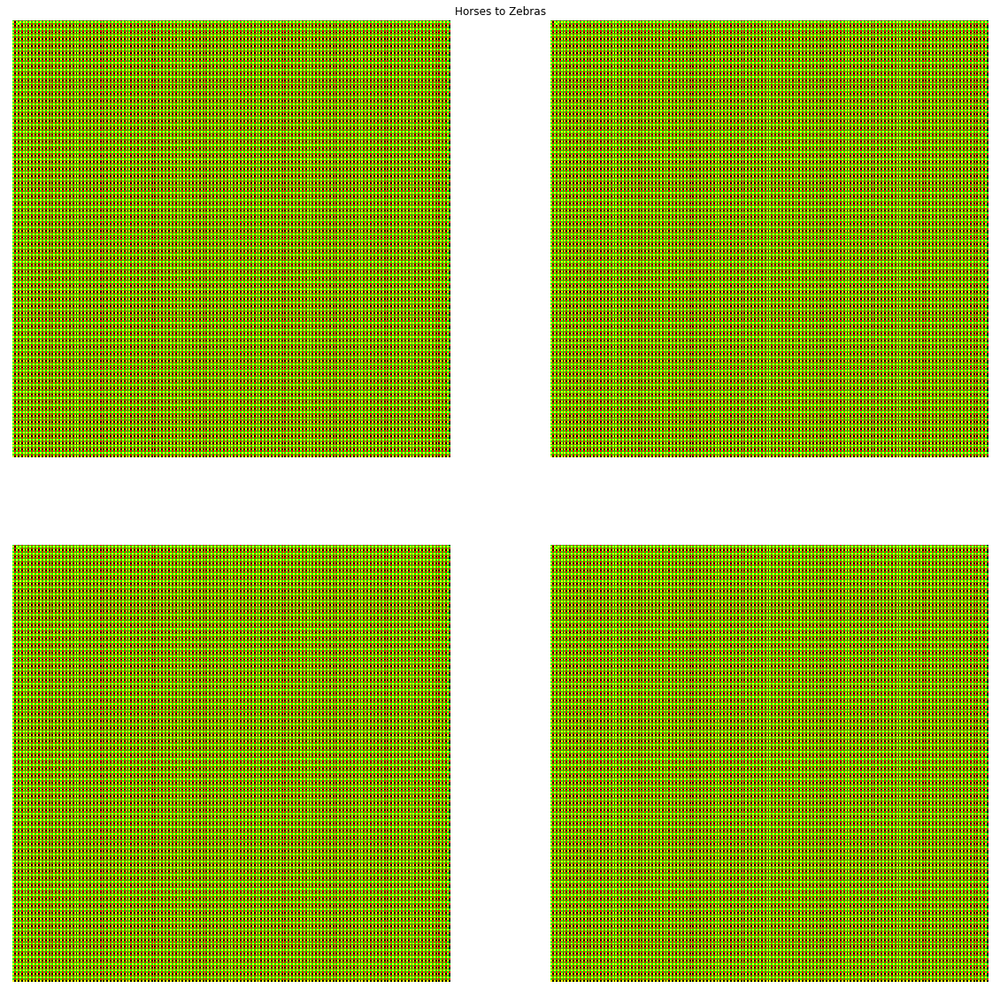

Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 9
Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 10
Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 11
Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 12


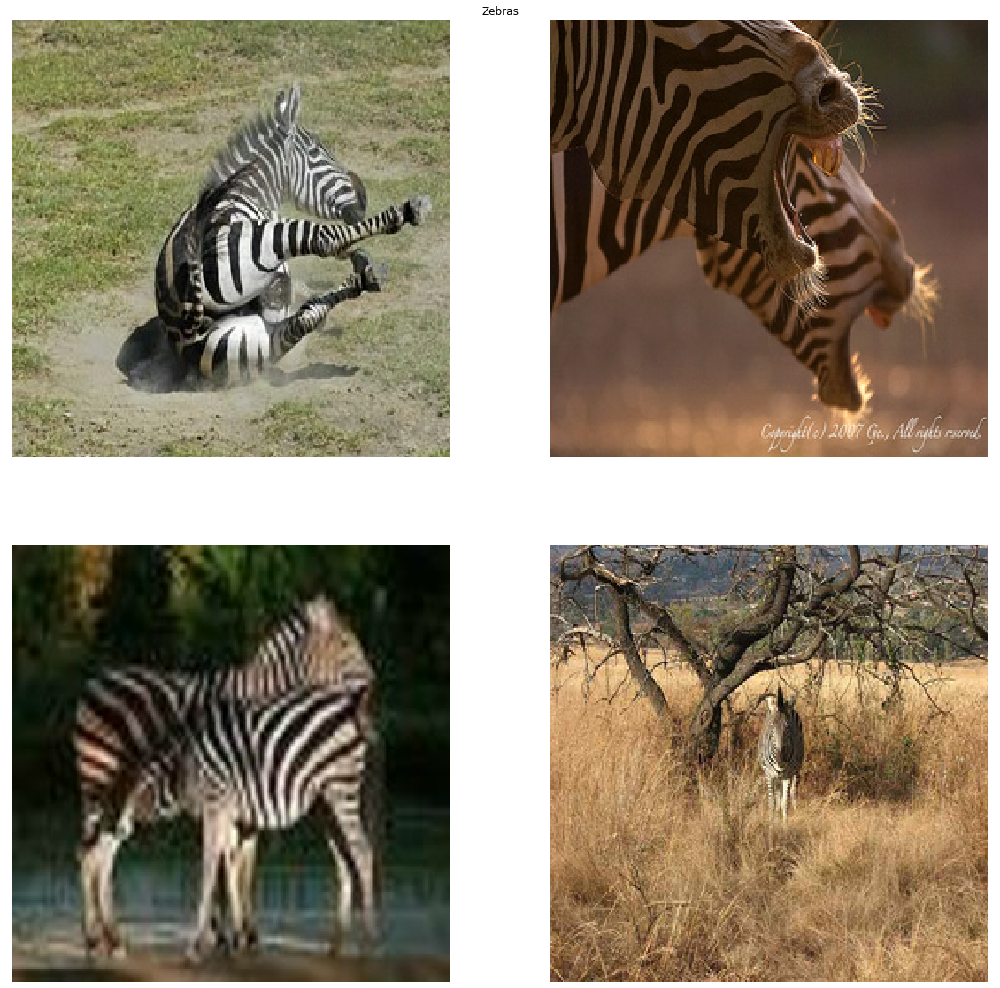

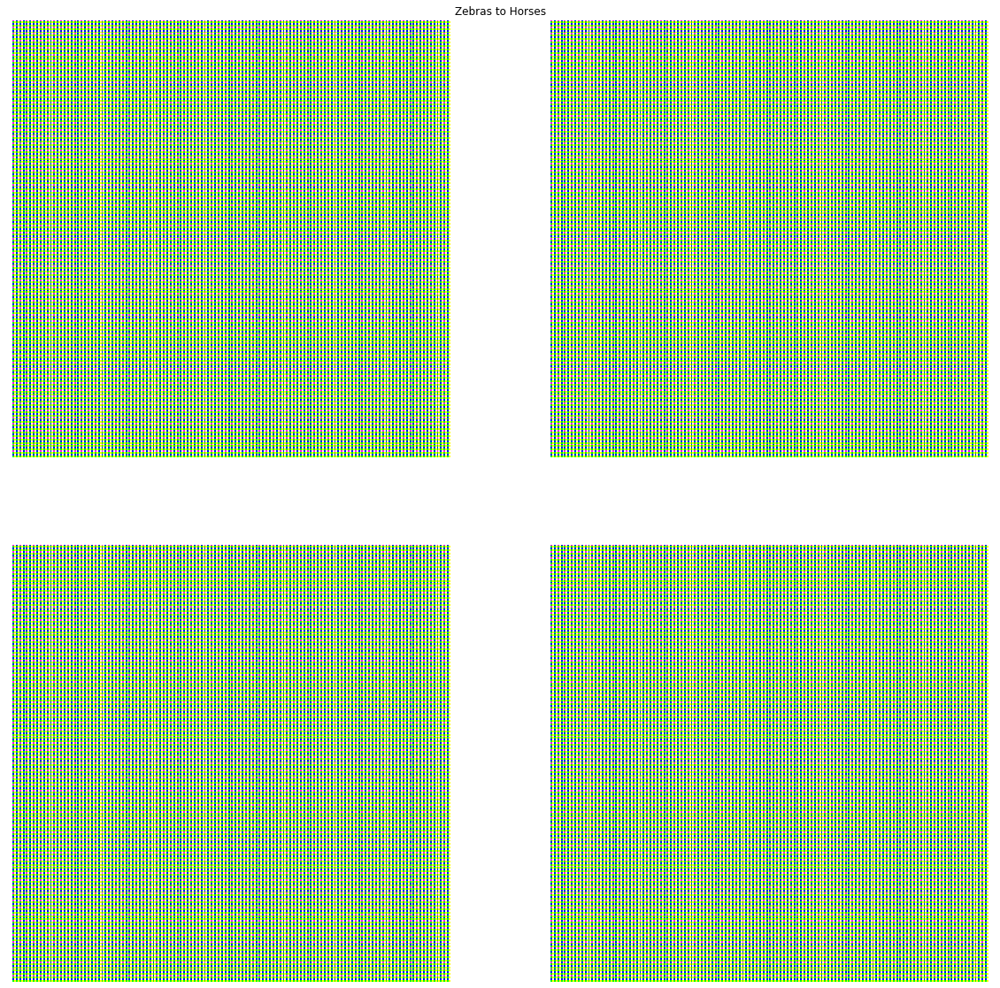

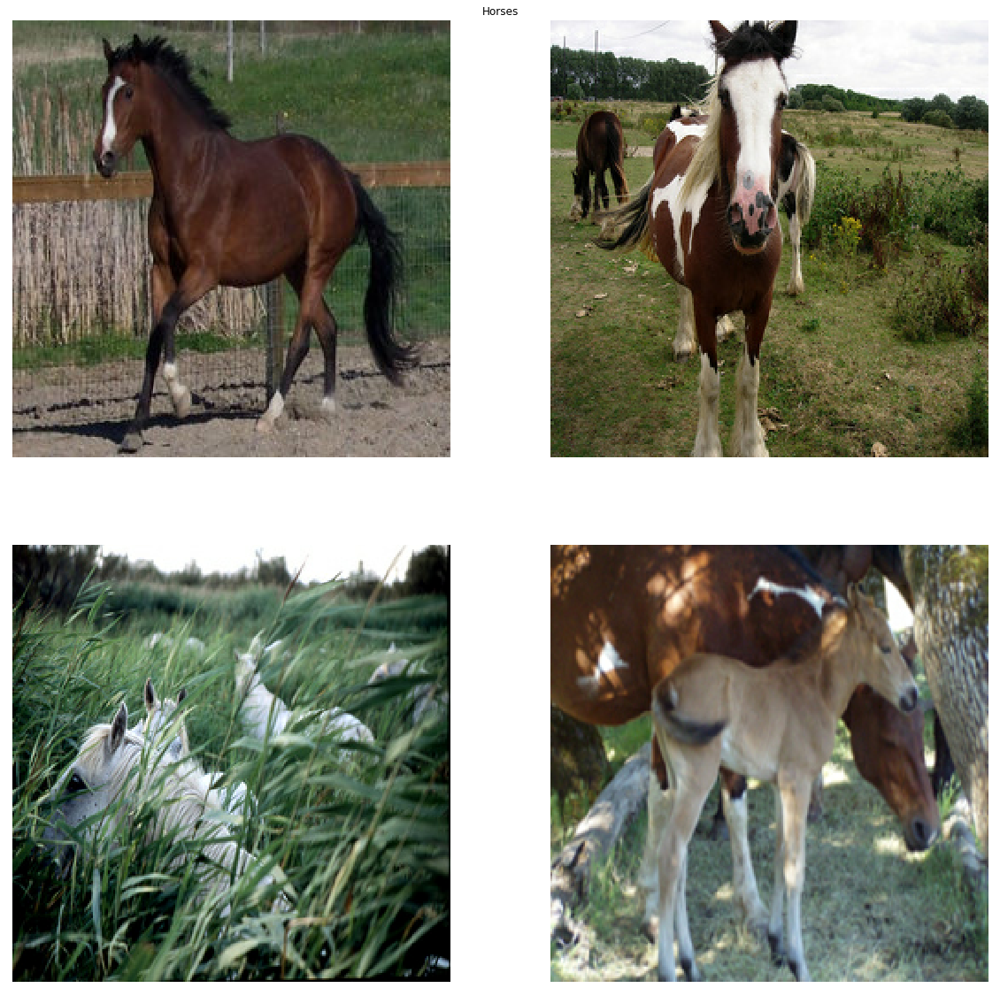

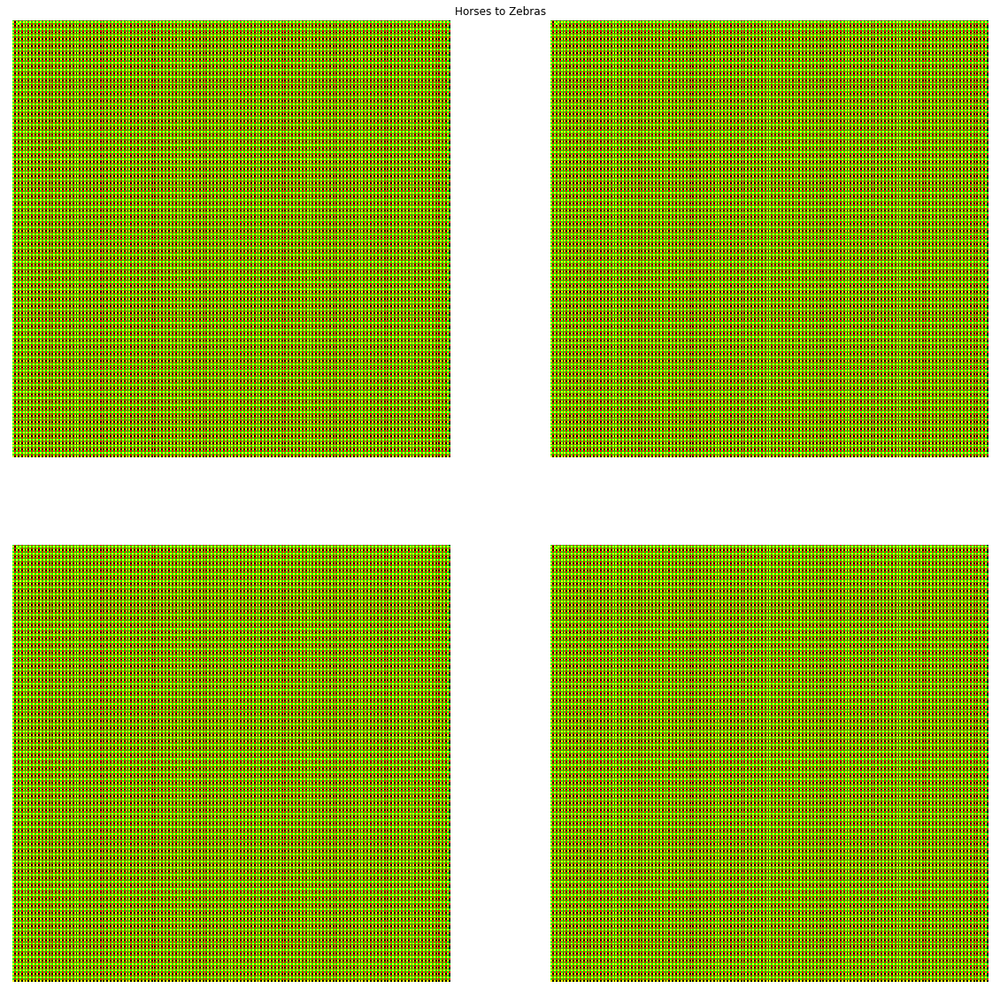

Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 13
Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 14
Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 15
Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 16


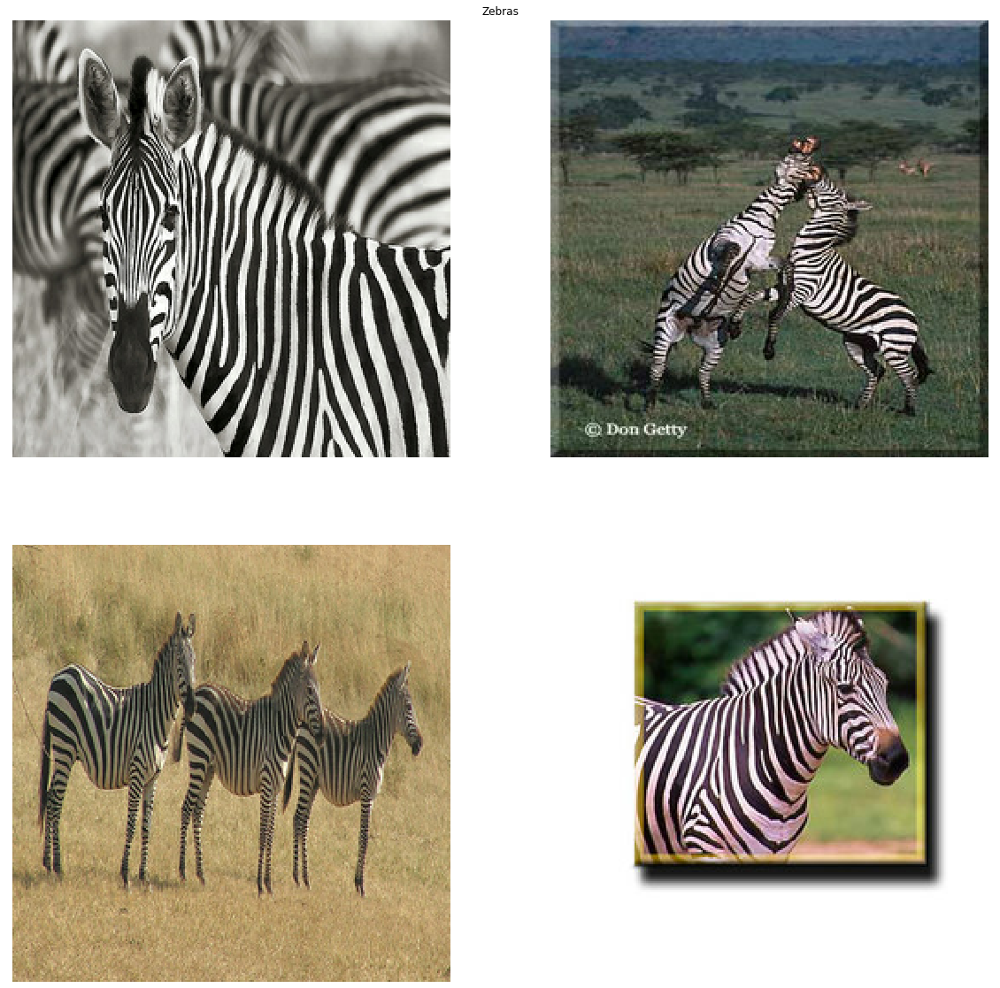

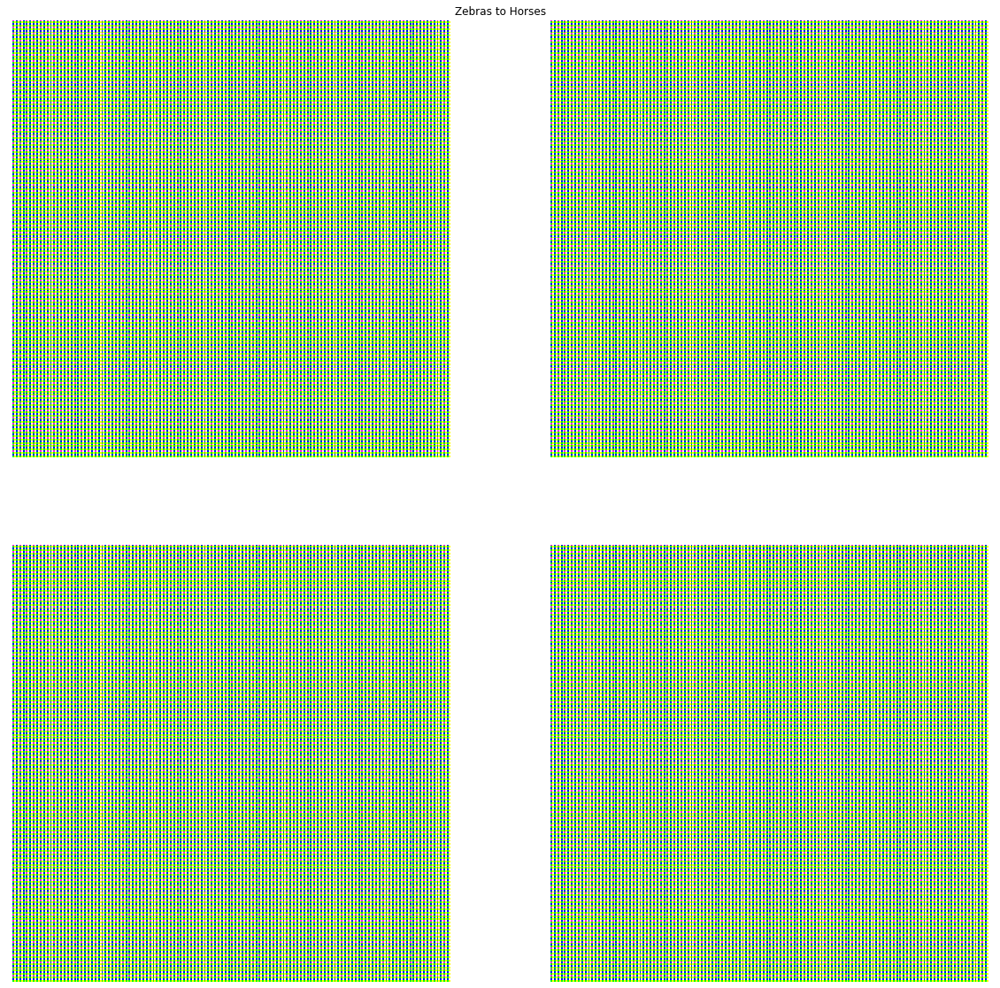

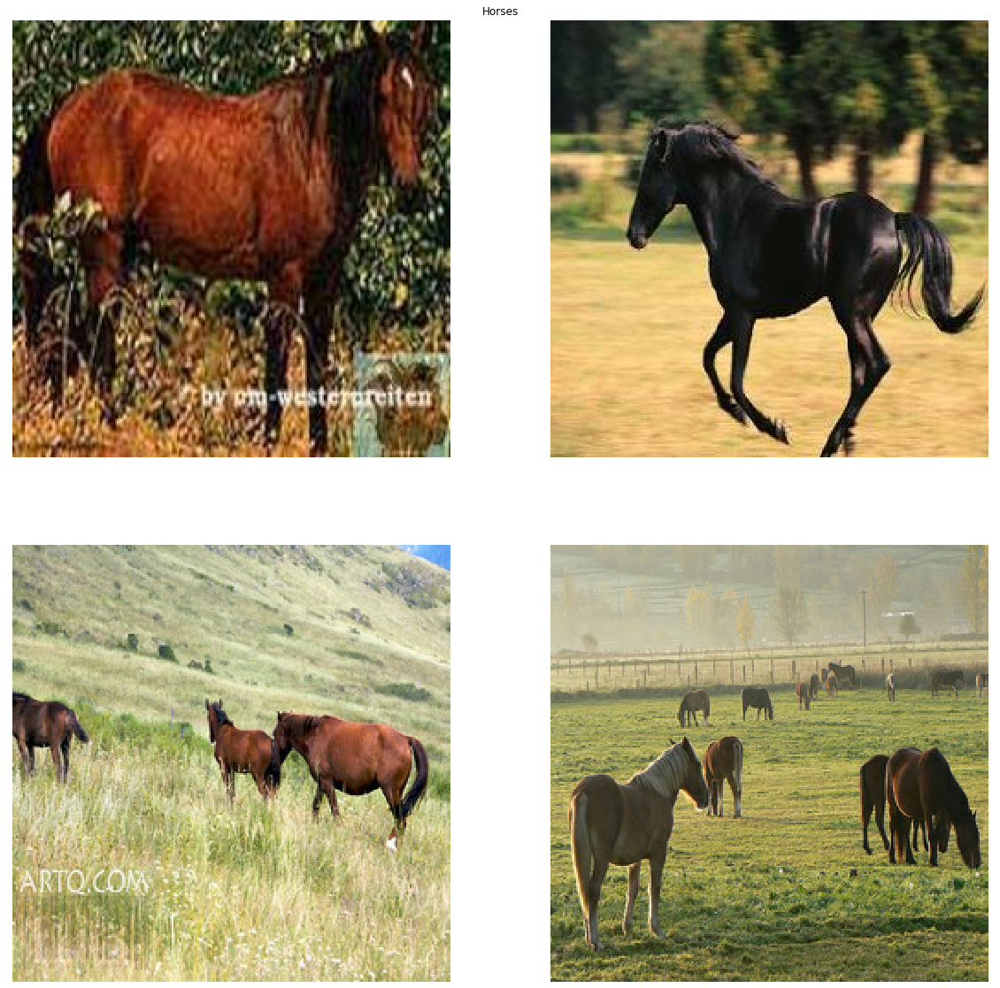

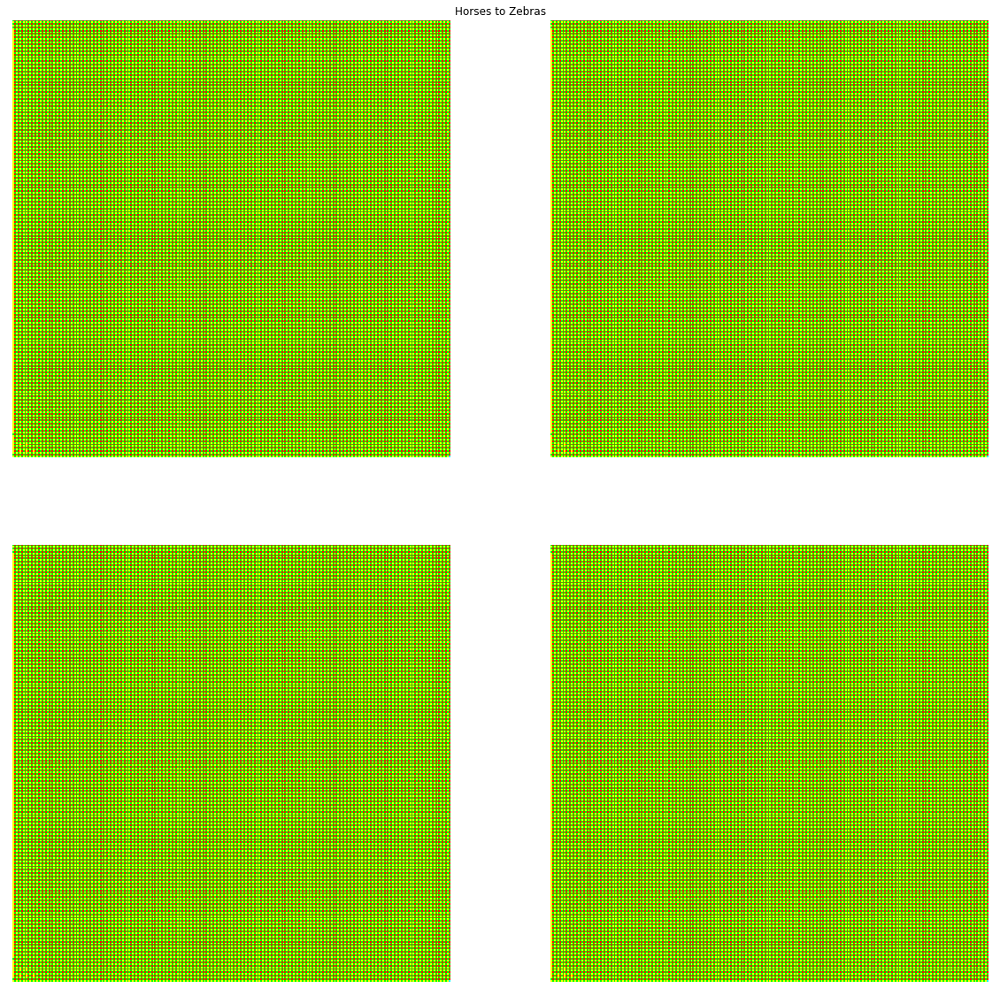

Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 17
Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 18
Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 19
Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 20


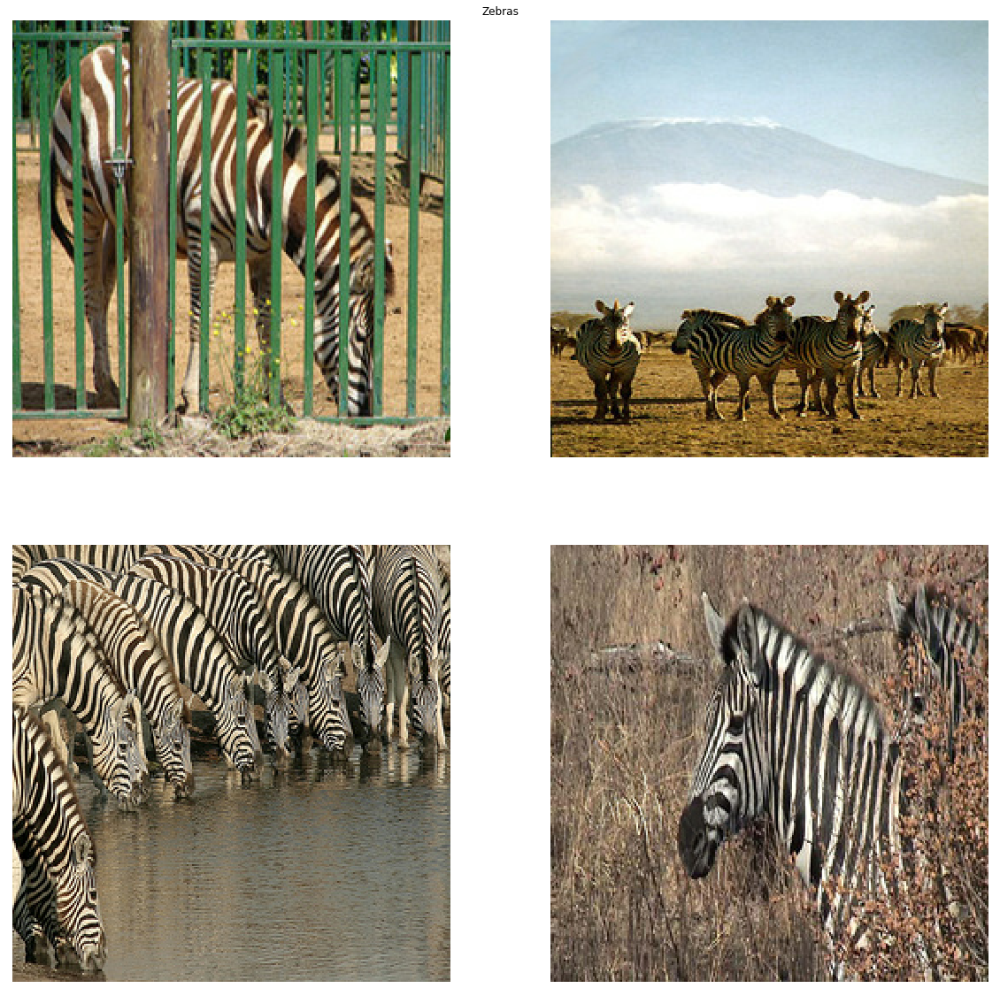

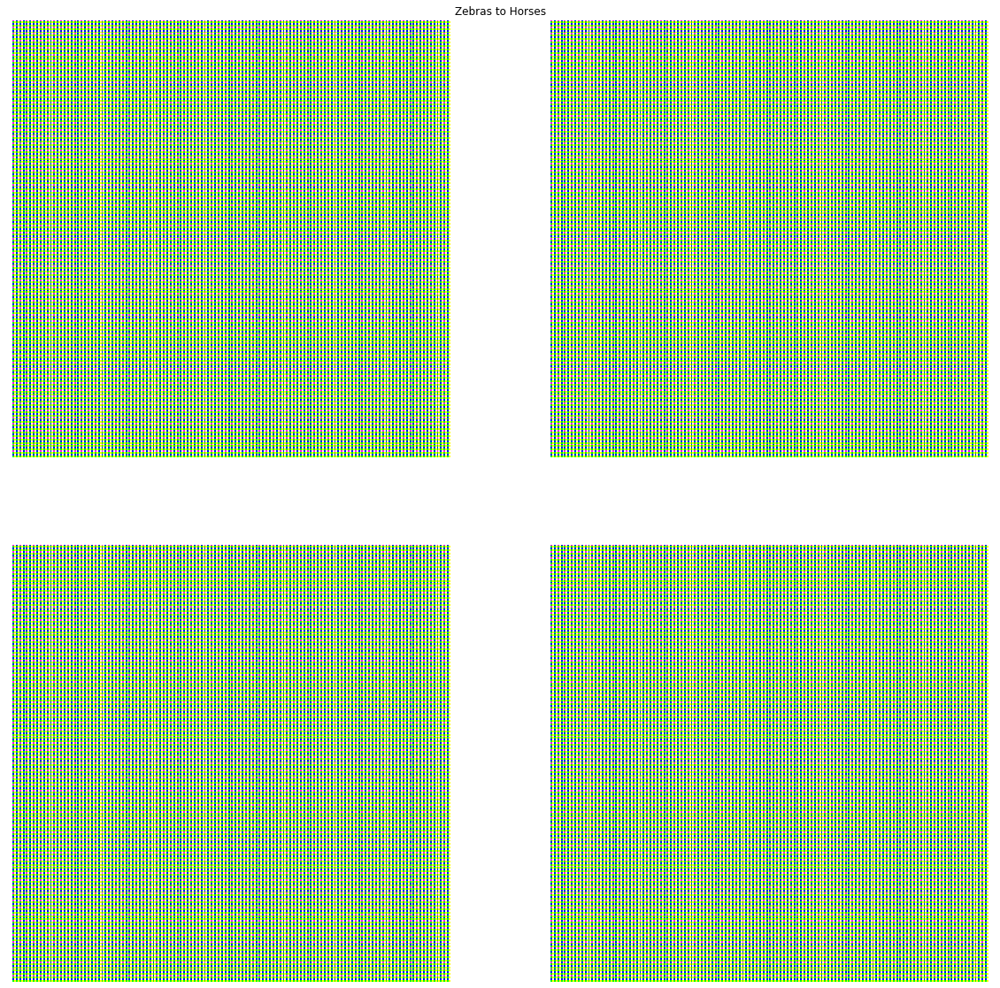

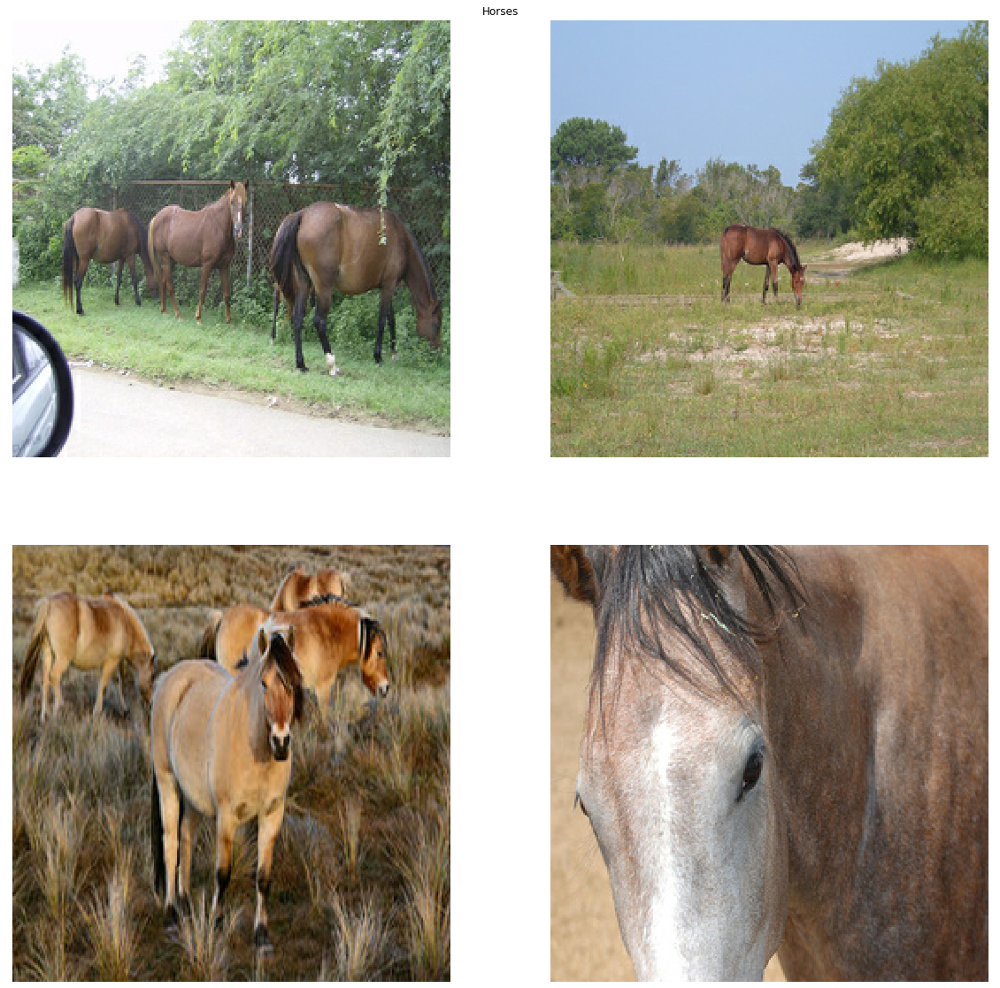

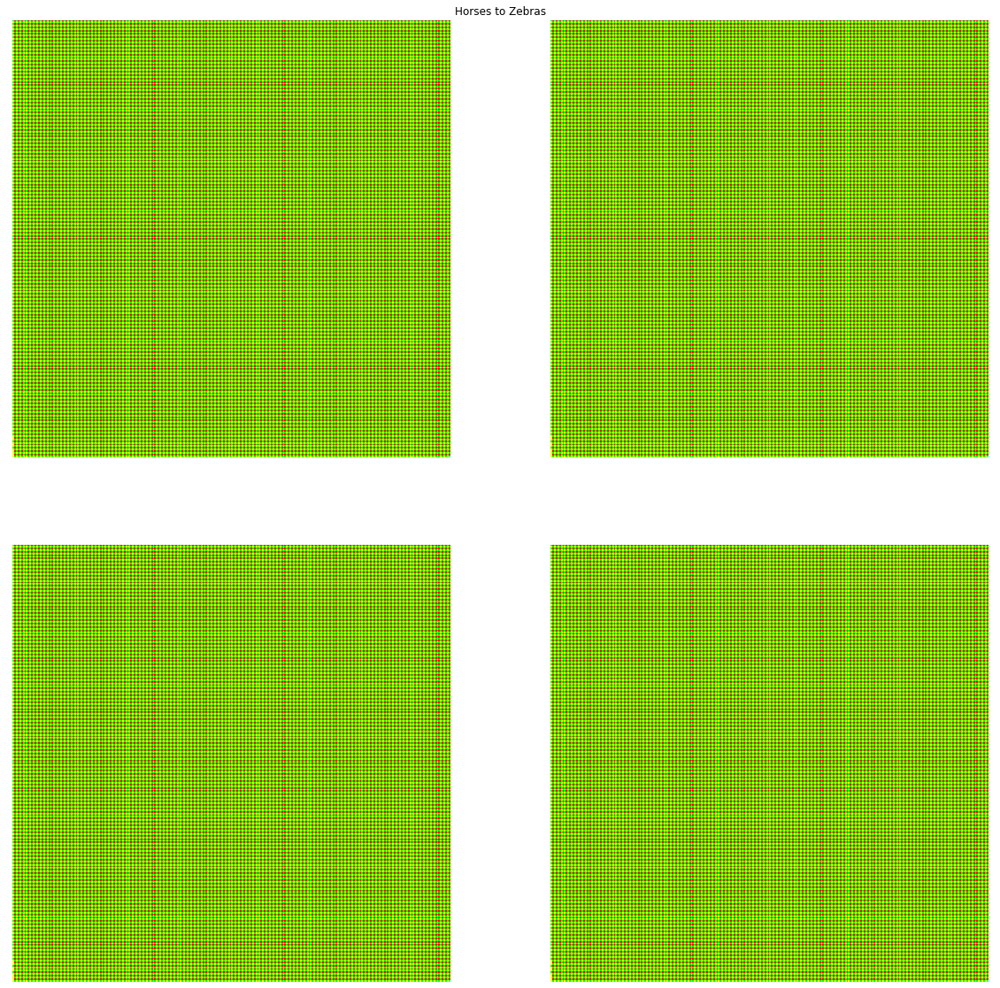

Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 21
Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 22
Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 23
Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 24


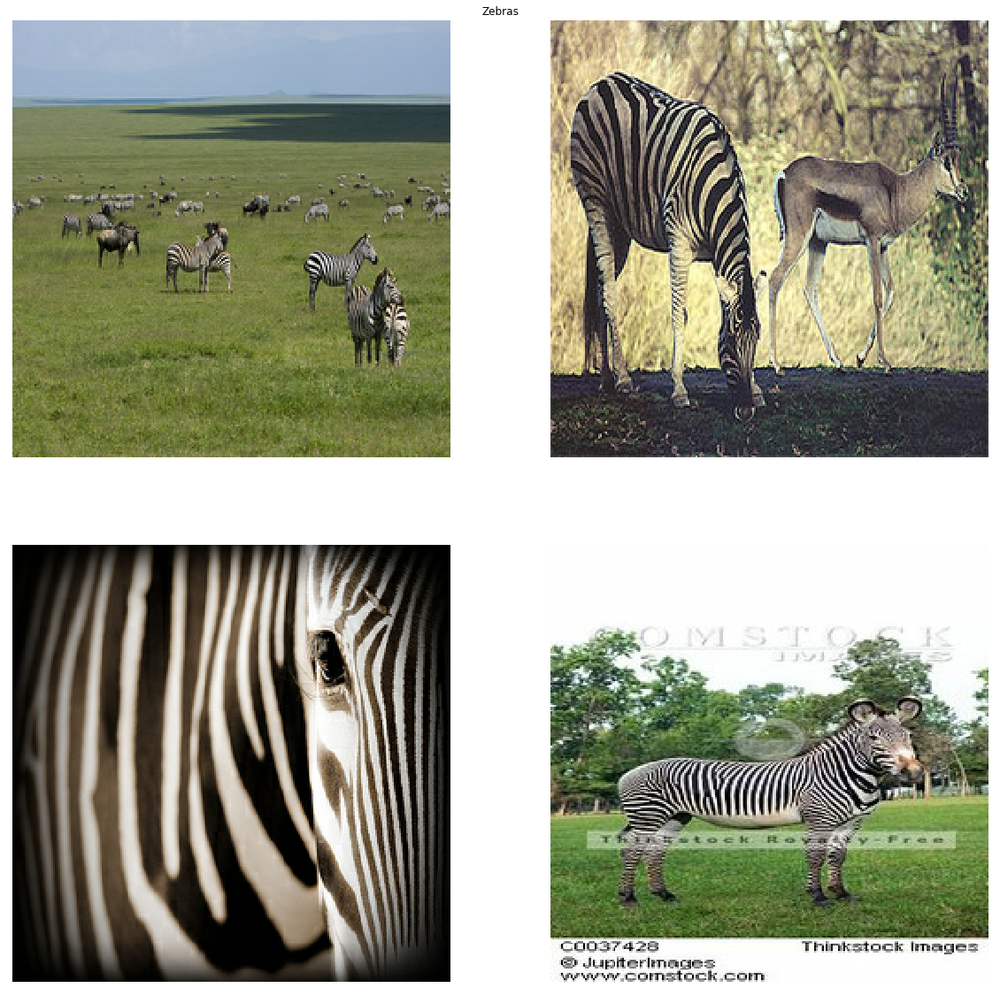

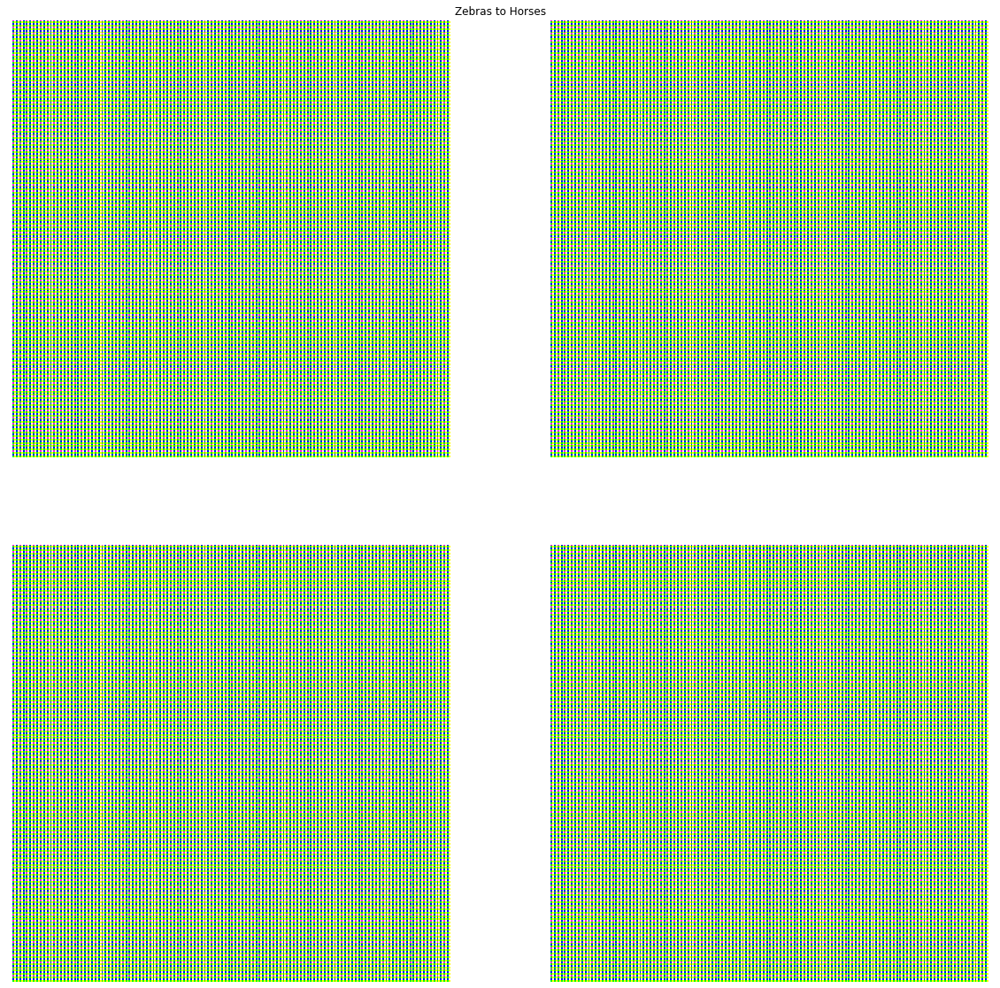

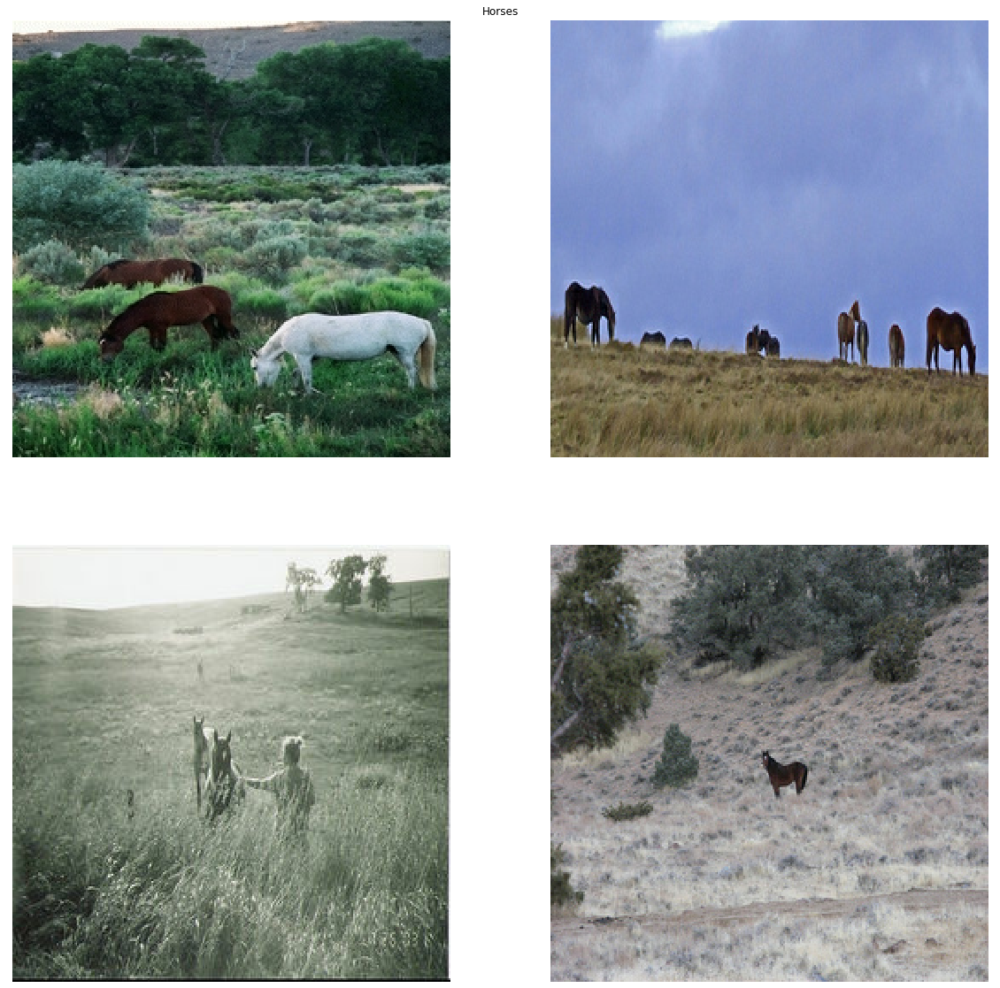

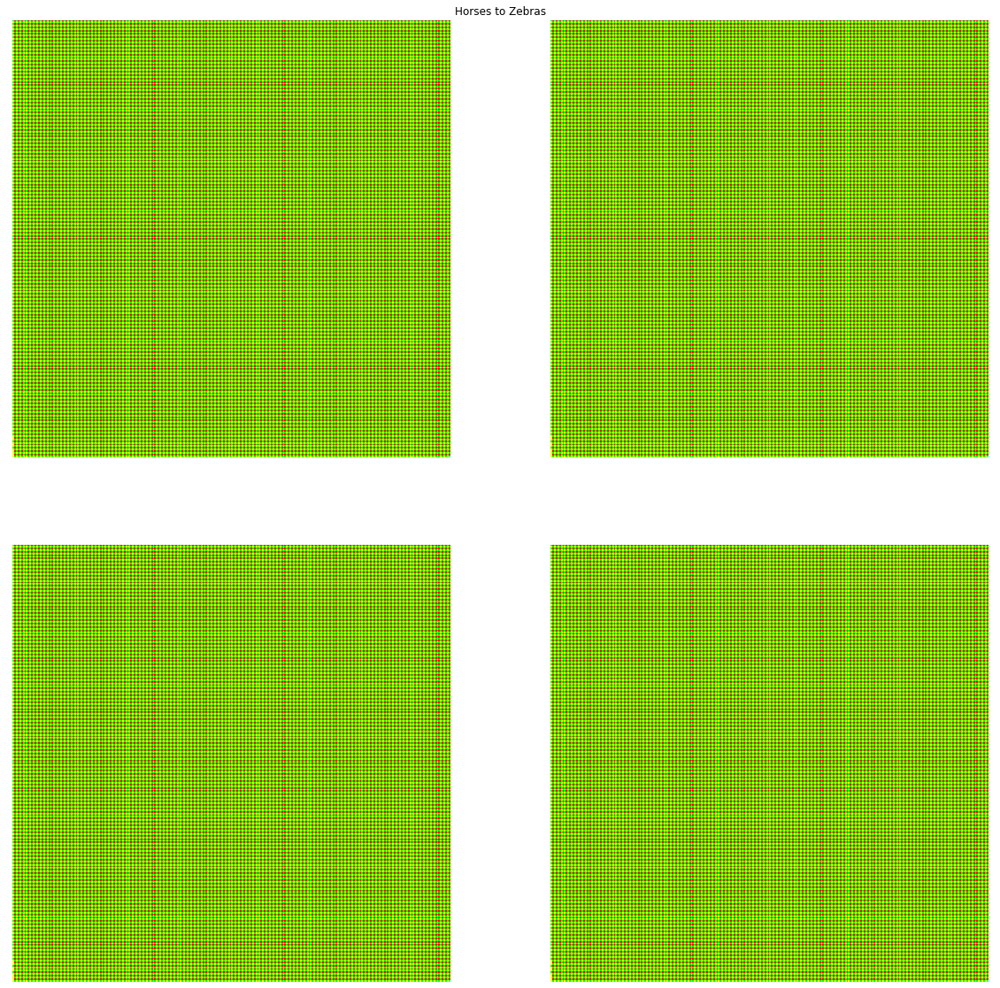

Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 25
Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 26
Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 27
Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 28


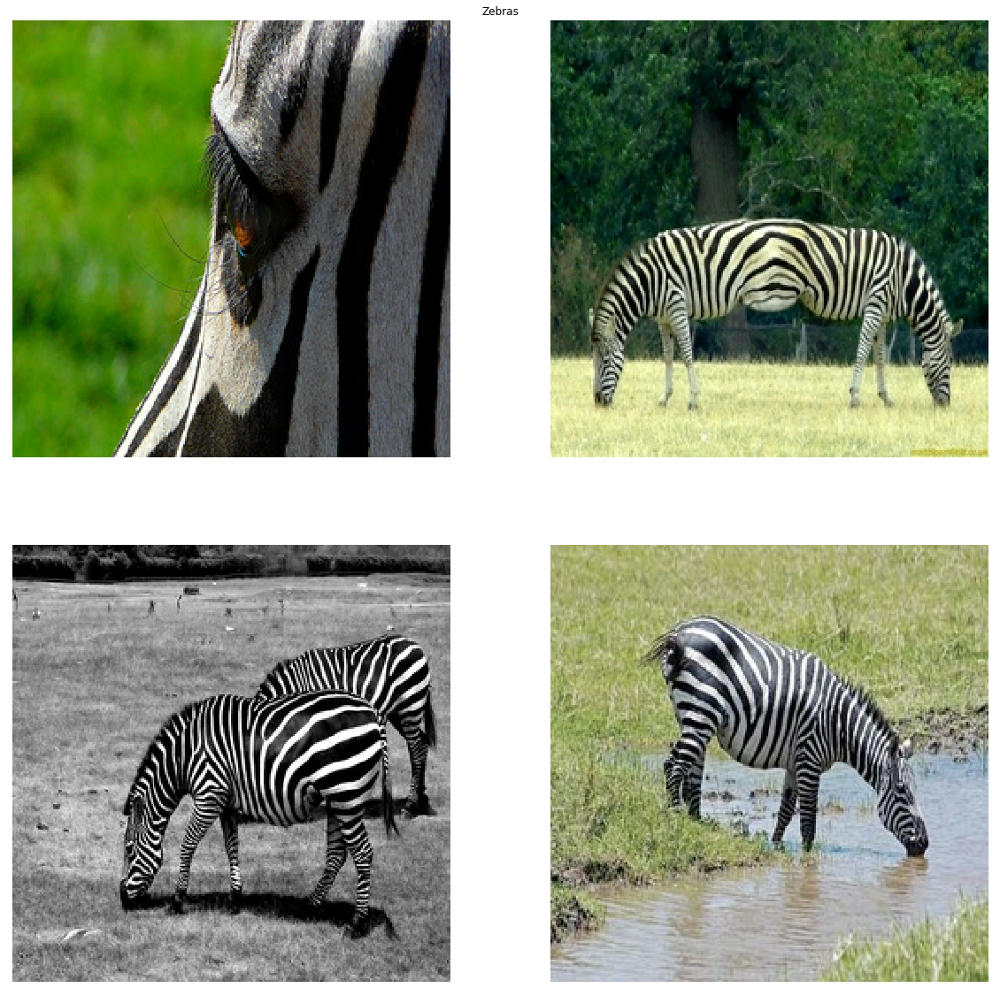

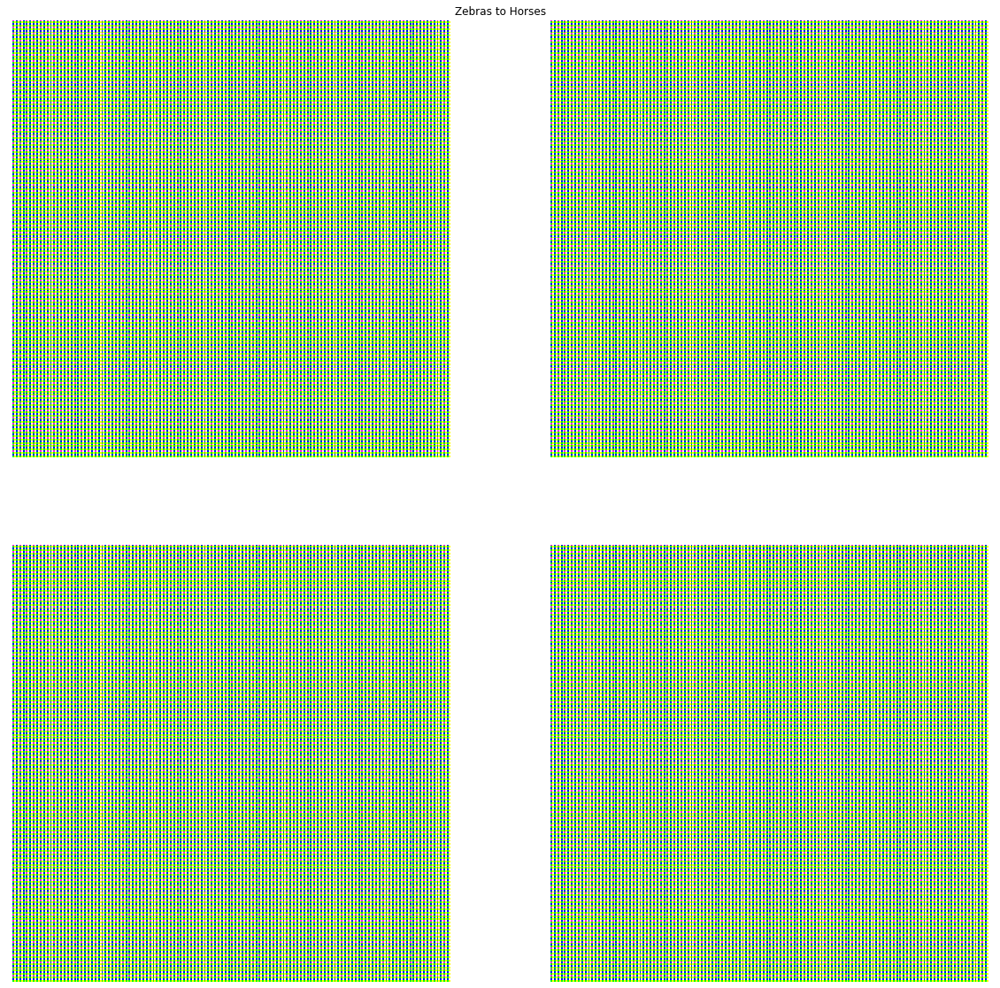

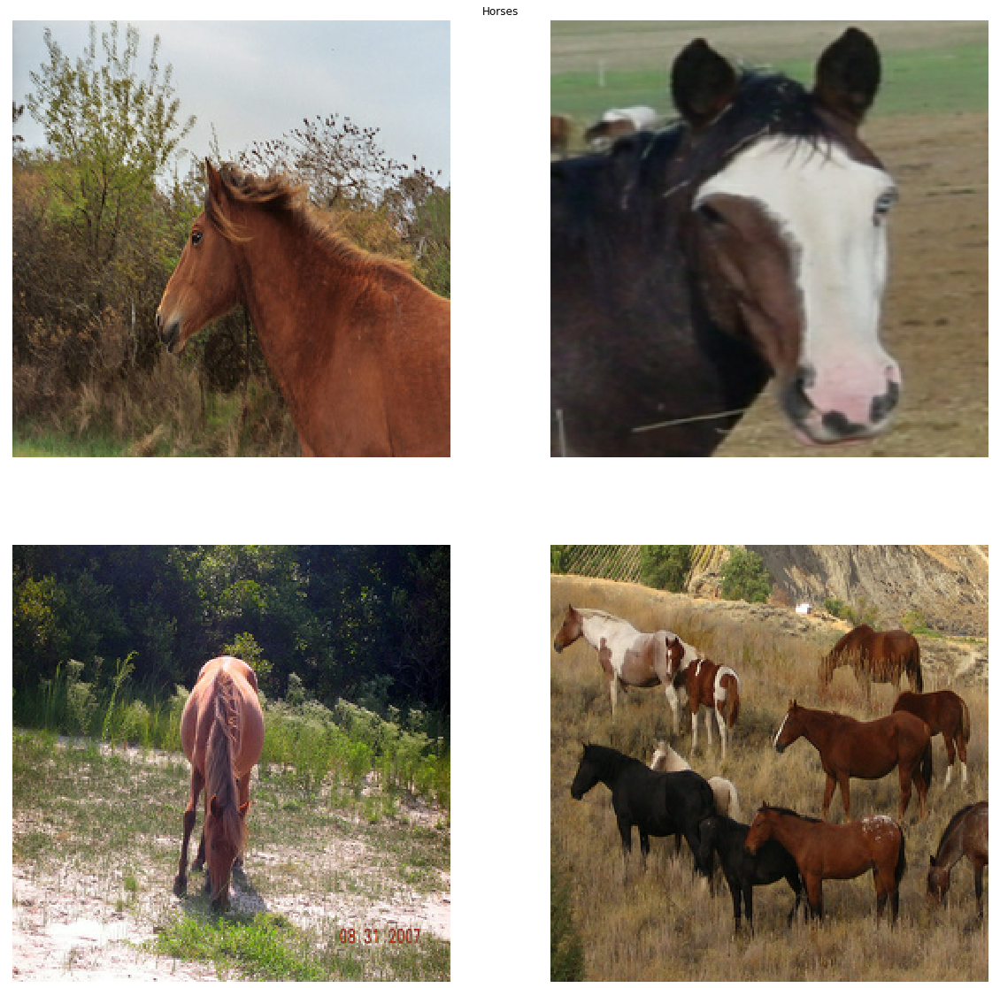

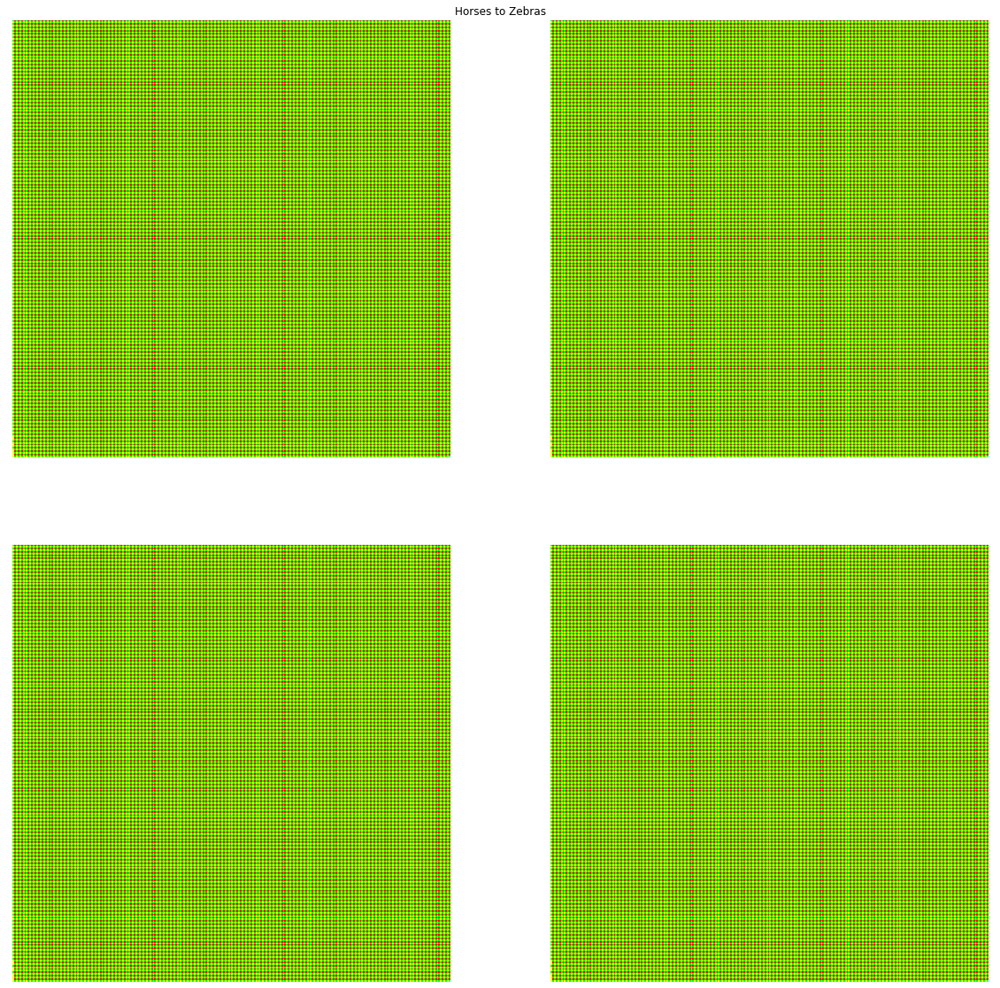

Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 29
Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 30
Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 31
Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 32


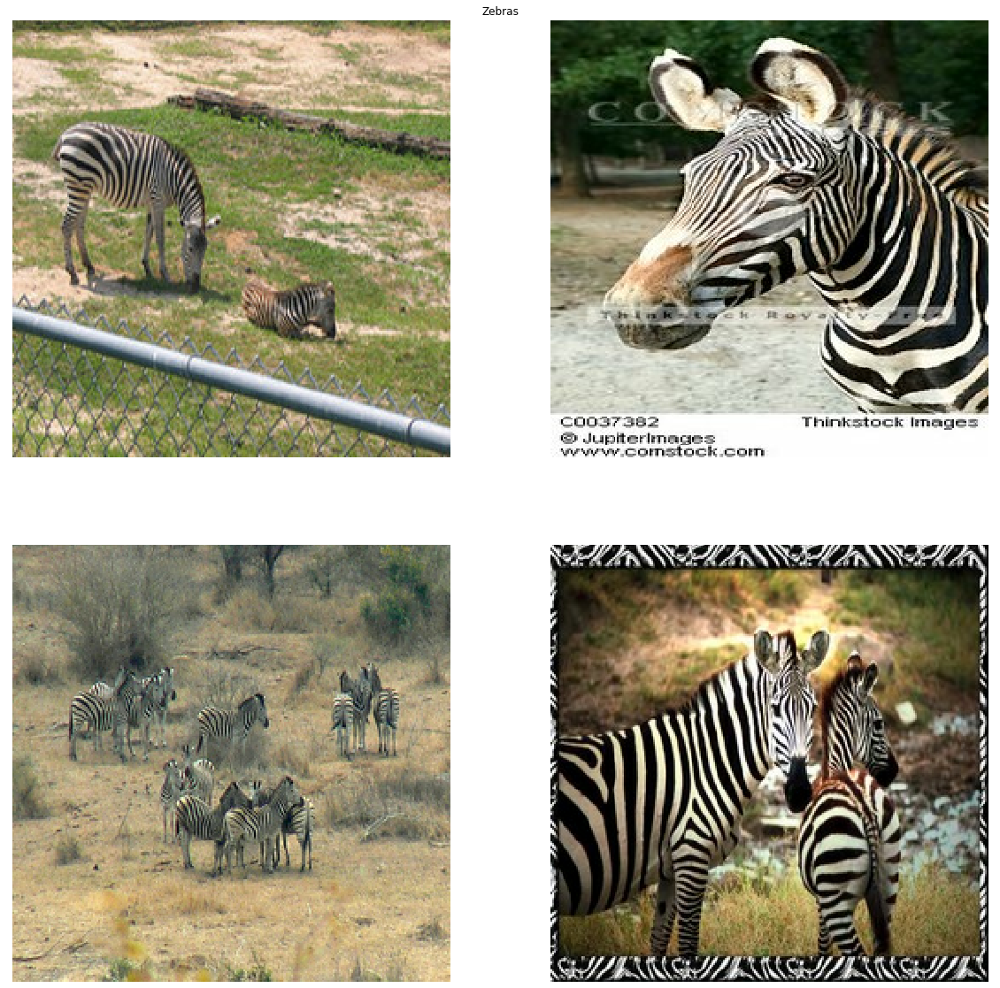

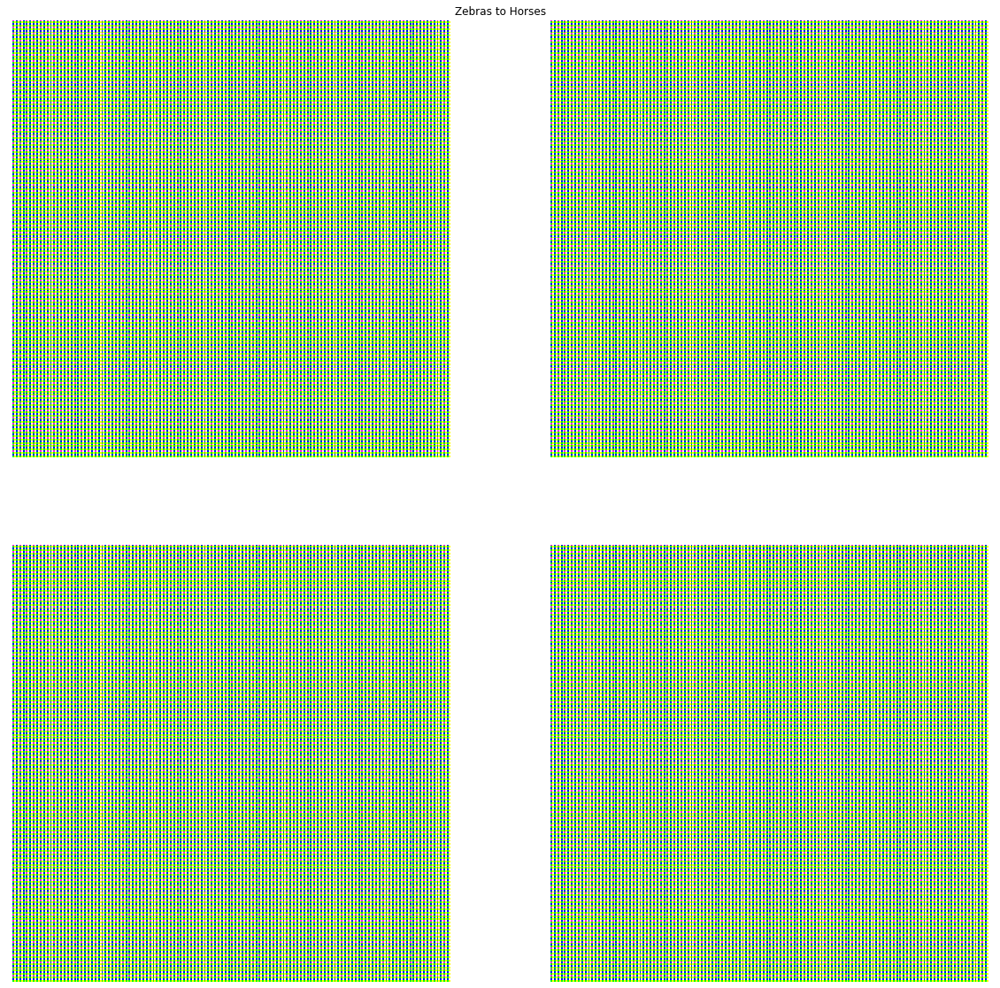

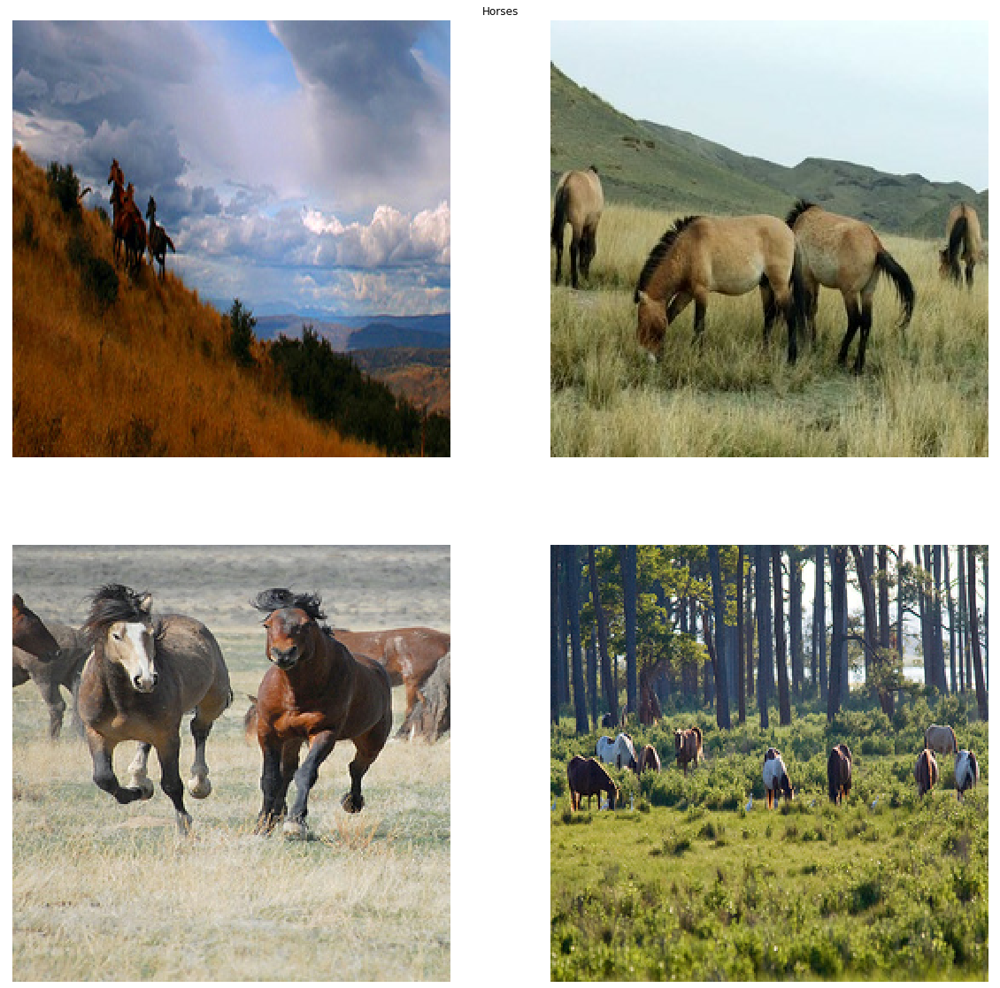

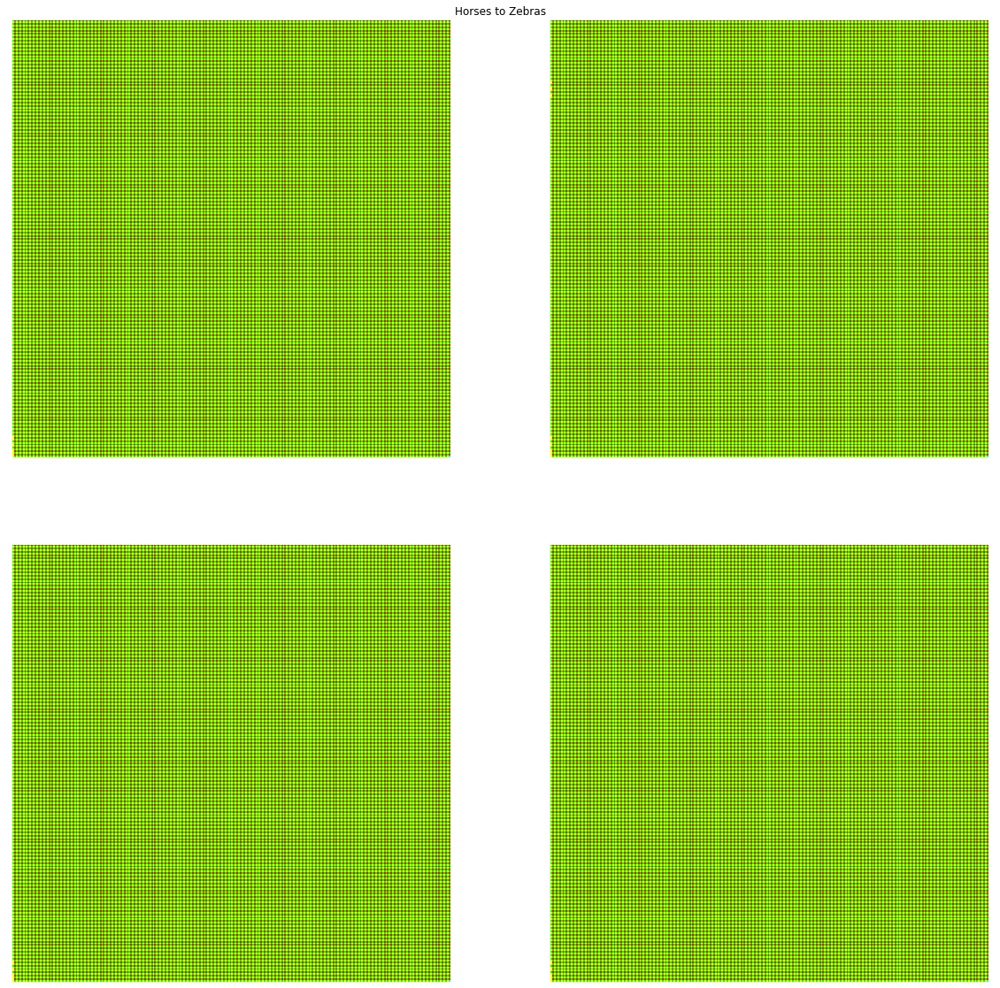

Batch 0
Batch 100
Batch 200
Batch 300
Batch 400
Batch 500
Batch 600
Starting epoch 33
Batch 0
Batch 100
Batch 200


In [ ]:
config = tf.ConfigProto()
config.gpu_options.allow_growth = True
count = 0
assert tf.test.is_gpu_available()
horse_to_zebra_pool = []
zebra_to_horse_pool = []
with tf.Session(config=config) as sess:
    # initialize variables
    sess.run(tf.global_variables_initializer())
    
    # initialize pool
    sess.run(train_horses_iterator.initializer)
    sess.run(train_zebras_iterator.initializer)
    while len(horse_to_zebra_pool) < pool_size and len(zebra_to_horse_pool) < pool_size:
        zebra = sess.run(train_zebras_batch)
        horse = sess.run(train_horses_batch)
        zebra_to_horse, horse_to_zebra = sess.run([gen_AtoB, gen_BtoA], feed_dict={input_A:zebra, input_B:horse})
        for layer in horse_to_zebra:
            horse_to_zebra_pool.append(layer)
        for layer in zebra_to_horse:
            zebra_to_horse_pool.append(layer)
    
    for epoch in range(100):
        print("Starting epoch", epoch)
        sess.run(train_horses_iterator.initializer)
        sess.run(train_zebras_iterator.initializer)
        step = 0
        count = 0
        while True:
            try:
                zebra = sess.run(train_zebras_batch)
                horse = sess.run(train_horses_batch)
                
                if (count == 0 and epoch % 4 == 0):
                    zebra_to_horse, horse_to_zebra = sess.run([gen_AtoB, gen_BtoA], feed_dict={input_A:zebra, input_B:horse})
                    display_graph(255*(zebra+1)/2, "Zebras", (2, 2), image_size=(20, 20))
                    display_graph(255*(zebra_to_horse+1)/2, "Zebras to Horses", (2, 2), image_size=(20, 20))
                    display_graph(255*(horse+1)/2, "Horses", (2, 2), image_size=(20, 20))
                    display_graph(255*(horse_to_zebra+1)/2, "Horses to Zebras", (2, 2), image_size=(20, 20))
                
                if (count % 10 == 0):
                    print("Batch", count*10)
                
                count += 1
                
                if zebra.shape[0] != horse.shape[0] or horse.shape[0] != batch_size:
                    break
                
                random.shuffle(horse_to_zebra_pool)
                horse_to_zebra_pool_sample = tf.concat(horse_to_zebra_pool[:-batch_size])
                random.shuffle(horse_pool)
                zebra_to_horse_pool = tf.concat(zebra_to_horse_pool[:-horse_pool])
                
                zebra_to_horse, horse_to_zebra, _, _, _, _, = sess.run(
                    [gen_AtoB, gen_BtoA, disc_A_train_op, disc_B_train_op, gen_AtoB_train_op, gen_BtoA_train_op], 
                    feed_dict={input_A:zebra, input_B:horse, pool_A:horse_to_zebra_pool_sample, pool_B:zebra_to_horse_pool_sample})
            
                random.shuffle(horse_to_zebra_pool)
                random.shuffle(zebra_to_horse_pool)
                horse_to_zebra_pool = horse_to_zebra_pool[:-batch_size]
                for layer in horse_to_zebra:
                    horse_to_zebra_pool.append(layer)
                horse_pool = horse_pool[:-batch_size]
                for layer in horse_to_zebra_pool:
                    horse_to_zebra_pool.append(layer)
            
            except tf.errors.OutOfRangeError:
                break


In [ ]:
zebra = sess.run(train_zebras_batch)
horse = sess.run(train_horses_batch)
zebra_to_horse, horse_to_zebra = sess.run([gen_AtoB, gen_BtoA], feed_dict={input_A:zebra, input_B:horse})
display_graph(255*(zebra+1)/2, "Zebras", (2, 2), image_size=(20, 20))
display_graph(255*(zebra_to_horse+1)/2, "Zebras to Horses", (2, 2), image_size=(20, 20))
display_graph(255*(horse+1)/2, "Horses", (2, 2), image_size=(20, 20))
display_graph(255*(horse_to_zebra+1)/2, "Horses to Zebras", (2, 2), image_size=(20, 20))